In [64]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training Dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [65]:
torch.manual_seed(0)

In [84]:
def show_tensor_images(image_tensor, num_images=25, size=(1,28,28)):
  """
  Function for visualizing images: Given a tensor of images, number of images, and
  size per image, plots and prints the images in a uniform grid.
  """
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()

##GENERATOR

 - A single layer/block for the generator's neural network.
 - Each block should include:
   - A linear transformation to map to another shape.
   - A batch Normalization for stabilization.
   - Finally a Non - linear activation function.


In [67]:
def get_generator_block(input_dim, output_dim):
  """
  Function for returning a block of the generator's neural network
  given input and output dimensions.

  Parameters:
    input_dim: the dimension of the input vector, a scalar
    output_dims: the dimension of the output vector, a scalar
  Returns:
    A generator neural network layer, with a linear transformation
    followed by a batch normalization and then with relu activation
  """

  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True)
  )

In [68]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
  block = get_generator_block(in_features, out_features)

  #check the three parts
  assert len(block) == 3
  assert type(block[0]) == nn.Linear
  assert type(block[1]) == nn.BatchNorm1d
  assert type(block[2]) == nn.ReLU

  # check the output shape
  test_input = torch.rand(num_test,  in_features)
  test_output = block(test_input)
  assert tuple(test_output.shape) == (num_test, out_features)
  assert test_output.std() > 0.55
  assert test_output.std() < 0.65

test_gen_block(25,12)
test_gen_block(15, 28)
print("Success")

Success


Now we can build a generator class. It will take three value:

 - The noise vector dimension
 - The image dimension
 - The initial hidden layer

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). The final layer does not need a normalization or activation function, but does need to be scaled with a sigmoid function.

In [69]:
class Generator(nn.Module):
  """
  Generator class
  values:
    z_dim: The dimesnion of noise vector. a scalr.
    im_dim: The dimension of the images, fitted for the dataset used, a scalar
    (MNIST images are 28x28 = 784 so that s is the default)
    hidden_dim: The inner dimension, a scalar
  """

  def __init__(self,z_dim=10, im_dim=784, hidden_dim=128):
    super(Generator, self).__init__()
    # Build the neural network
    self.gen = nn.Sequential(
        get_generator_block(z_dim, hidden_dim),
        get_generator_block(hidden_dim, hidden_dim*2),
        get_generator_block(hidden_dim*2, hidden_dim*4),
        get_generator_block(hidden_dim*4, hidden_dim*8),
        nn.Linear(hidden_dim*8, im_dim),
        nn.Sigmoid()
    )

  def forward(self, noise):
      """
      Function for completeing a forward pass of the generator: Given a noise tensor,
      returns generated images.
      Parameters:
        noise: a noise tensor with dimensions (n_samples, z_dim)
      """
      return self.gen(noise)

  def get_gen(self):
      """
      Returns:
        The sequential model
      """
      return self.gen

In [70]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
  gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

  # Check there are siz modules in the sequential part
  assert len(gen) == 6
  test_input = torch.randn(num_test, z_dim)
  test_output = gen(test_input)

  # Check that the output shape is correct
  assert tuple(test_output.shape) == (num_test, im_dim)
  assert test_output.max() < 1, "Make sure to use the sigmoid"
  assert test_output.min() > 0, "Make sure to use a sigmoid"
  assert test_output.min() < 0.5, "Dont use a block in your solution"
  assert test_output.std() > 0.05, "Dont use a batchnorm here"
  assert test_output.std() < 0.15, "Dont use batchnorm here"

test_generator(5,10,20)
test_generator(20,8,24)
print("Success")

Success


##NOISE

 - To be able to use our generator, we will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. We will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, we will generate all the noise vectors at once.



**Note** that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. torch.ones(3, 3, device=device), or move it onto the target device using torch.ones(3, 3).to(device). You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as torch.ones_like. In general, use torch.ones_like and torch.zeros_like instead of torch.ones or torch.zeros where possible.

In [71]:
def get_noise(n_samples, z_dim, device='cpu'):
  """
  Function for creating noise vectors: Given the dimensions (n samples, z_dim),
  Creates a tensor of that shape filled with random numbers for the normal distribution.
  Parameters:
    n_samples: the number of samples to generate, a scalar
    z_dim: the dimesnion of the noise vector, a scalar
    device: the device type
  """

  return torch.randn(n_samples, z_dim, device=device)


In [72]:
#Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
  noise = get_noise(n_samples, z_dim, device)

  #Make sure a normal distribution was used
  assert tuple(noise.shape) == (n_samples, z_dim)
  assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
  assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
  test_get_noise(1000, 32, 'cuda')
print("Success")

Success


## DISCRIMINATOR



In [73]:
def get_discriminator_block(input_dim, output_dim):
  '''
  Discriminator Block
  Function for returning a neural network of the discriminator given input and output dimensions.
  Parameters:
    input_dim: the dimension of the input vector, a scalar
    output_dim: the dimension of the oupput vector, a scalar
  Returns:
    a discriminator neural netwrok layer, with a linear transformation
    followed by an nn.LeakyReLU activation with negative slope of 0.2
  '''

  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.LeakyReLU(0.2, inplace=True)
  )

In [74]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
  block = get_discriminator_block(in_features, out_features)

  # Check there are two parts
  assert len(block) == 2
  test_input = torch.randn(num_test, in_features)
  test_output = block(test_input)

  # Check that the shape is right
  assert tuple(test_output.shape) == (num_test, out_features)

  #check that the LeakyReLU slope is 0.2
  assert -test_output.min()/test_output.max() > 0.1
  assert -test_output.min()/test_output.max() < 0.3
  assert test_output.std() > 0.3
  assert test_output.std() < 0.5

test_disc_block(25,12)
test_disc_block(15,28)
print("Success")

Success


The Discriminator class holds 2 values:
 - The image dimension
 - The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real.

In [75]:
class Discriminator(nn.Module):
  '''
  Discriminator class
  Values:
    im_dim: the dimension of the images, fitted for the dataset used, a scalar
    (MNIST images are 28x28 = 784 so that is your default)
    hidden_dim: the inner dimension a scalar
  '''
  def __init__(self,im_dim=784,hidden_dim=128):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        get_discriminator_block(im_dim, hidden_dim*4),
        get_discriminator_block(hidden_dim*4, hidden_dim*2),
        get_discriminator_block(hidden_dim*2, hidden_dim),
        nn.Linear(hidden_dim, 1)
    )

  def forward(self, image):
    '''
    Function for completing a forward pass of the discriminator: Given an image tensor
    returns a 1-dimension tensor representing fake/real.
    Parameters:
      image: a flattened image tensor with dimension (im_dim)
    '''
    return self.disc(image)

  def get_disc(self):
    '''
    Returns:
      the sequential model
    '''
    return self.disc

In [76]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
  disc = Discriminator(z_dim, hidden_dim).get_disc()

  #Check there are three parts
  assert len(disc) == 4

  #Check the linear layer is correct
  test_input = torch.randn(num_test, z_dim)
  test_output = disc(test_input)
  assert tuple(test_output.shape) == (num_test, 1)

  # Dont use a block
  assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success")

Success


##Training

 - criterion: the loss function
 - n_epochs: the number of times you iterate through the entire dataset when training
 - z_dim: the dimension of the noise vector
 - display_step: how often to display/visualize the images
 - batch_size: the number of images per forward/backward pass
 - lr: the learning rate
 - device: the device type, here using a GPU (which runs CUDA), not CPU

In [77]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True
)

device = 'cuda'

In [78]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

In [79]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  '''
  Return the loss of the discriminator given inputs.
  Parameters:
    gen: the generator mode, which returns an image given z-dimensional noise
    disc: the disciminator model, which returns a single -dimensional prediction of real/fake
    criterion: the loss function, which should be used to compare the discriminator's
            predictions to the ground truth reality of the images(eg. fake=0, real=1)
    real: a batch of the real images
    num_images: the number of images the generator should produce,
            which is also the length of the real images
    z_dim: the dimension of the noise vector, a scalar
    device: the device type
  Returns:
      disc_loss: a torch scalar loss value for the current batch
  '''

  # Steps to be done
  # 1) Create noise vectors and generate a batch (num_images) of fake images.
  #      Make sure to pass the device argument to the noise.
  # 2) Get the discriminators predictio of the fake image and calculate the loss.
  #     And dont forget to Detach the generator
  # (Remember the loss function you set earlier -- criterion. You need a
  #            'ground truth' tensor in order to calculate the loss.
  #            For example, a ground truth tensor for a fake image is all zeros.)
  # 3) Get the discriminators predictions of the real image and calculate the loss
  # 4) Calculate the discriminators loss by averaging the real and fake loss and set it to disc_loss

  fake_noise = get_noise(num_images, z_dim, device=device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake.detach())
  disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
  disc_real_pred = disc(real)
  disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
  disc_loss = (disc_fake_loss + disc_real_loss)/2
  return disc_loss

In [80]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)

    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data

        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [81]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  '''
  Return the loss of the generators given inputs.
  Parameters:
    gen: the generators model, which returns an image given z_dimensional noise
    disc: the discriminator model, which returns a single dimensional prediction of real/Fake
    criterion: the loss function, which should be used to compare the discriminators prediction to ground truth reality of the images.
    num_images: the number of the images the generator should produce,
            which is also the length of the real image
    z_dim: the dimension of the noise vector, a scalar
    device: the device type
  Returns:
      gen_loss: a torch scalar loss values for the current batch
  '''

    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images.
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

  fake_noise = get_noise(num_images, z_dim, device=device)
  fake = gen(fake_noise)
  disc_fake_pred = disc(fake)
  gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
  return gen_loss


In [82]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device)
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)

    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.7201414659023282, discriminator loss: 0.29080315241217597


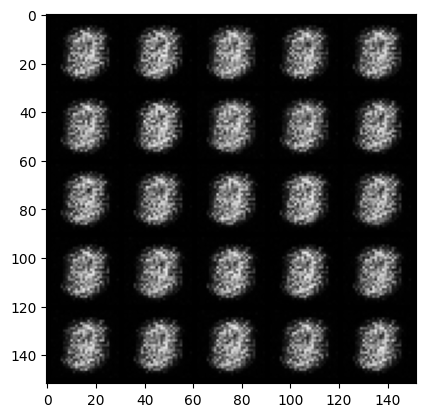

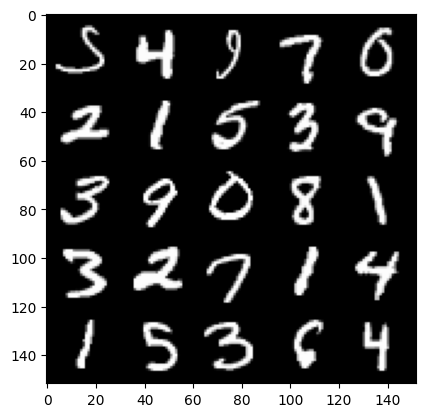

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.9906297624111173, discriminator loss: 0.16935966789722448


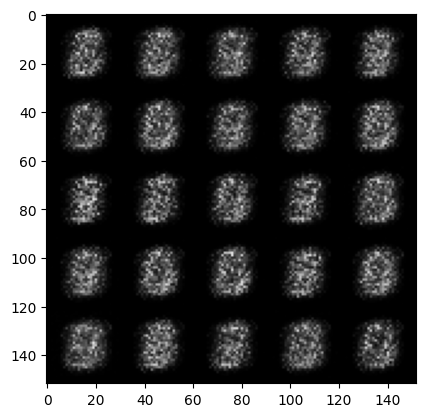

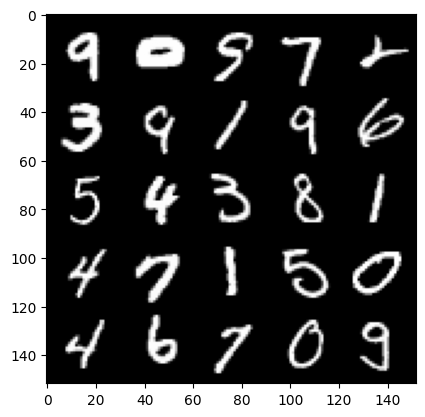

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 1.6538851764202105, discriminator loss: 0.23106345158815392


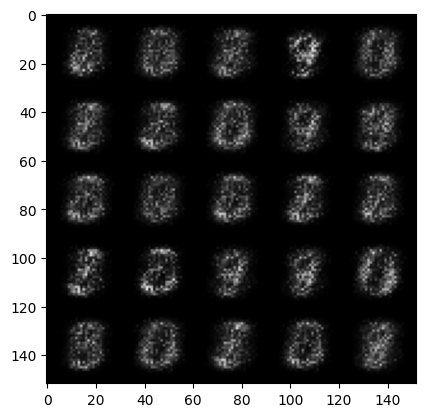

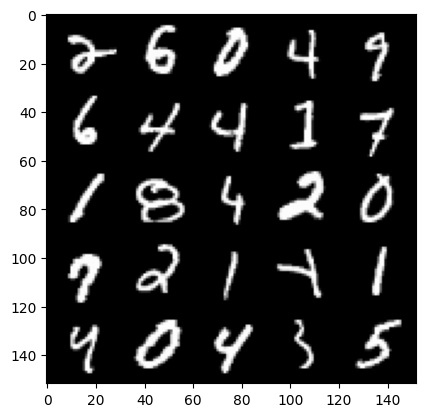

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.5378540470600144, discriminator loss: 0.24318276461958876


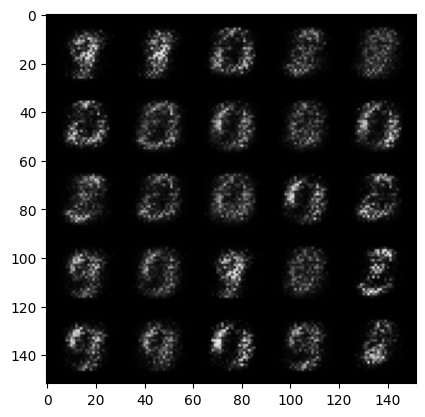

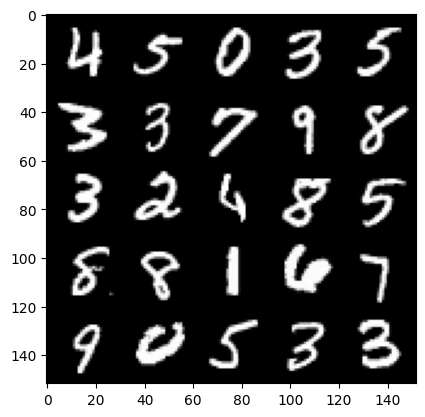

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.750562764406204, discriminator loss: 0.19778289380669606


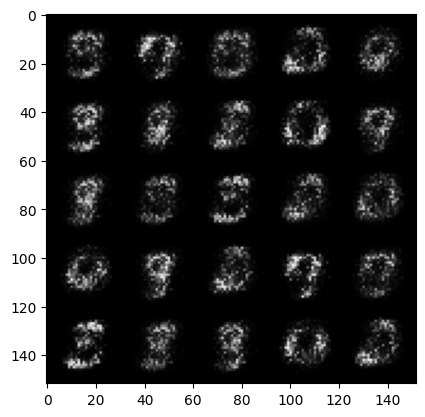

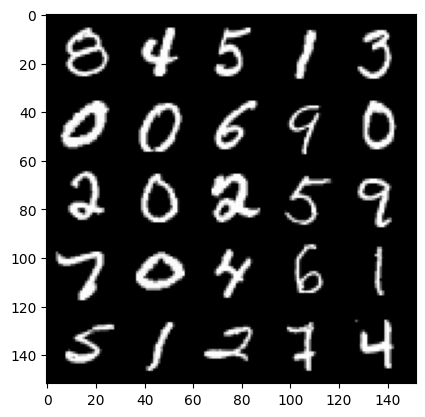

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 2.1957835981845855, discriminator loss: 0.14619786684215064


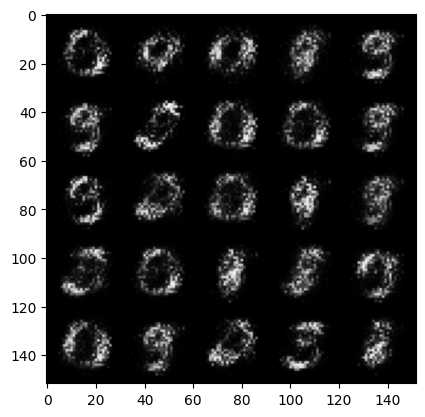

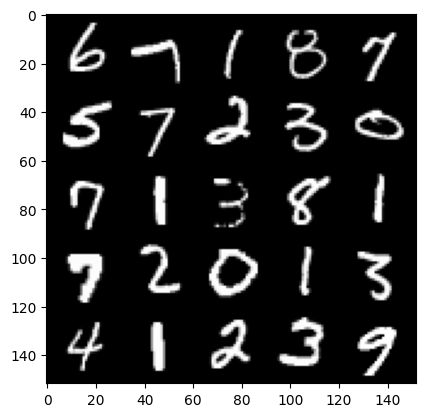

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.4847620825767516, discriminator loss: 0.13950122167170034


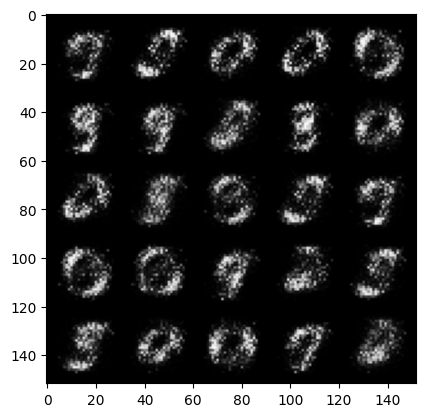

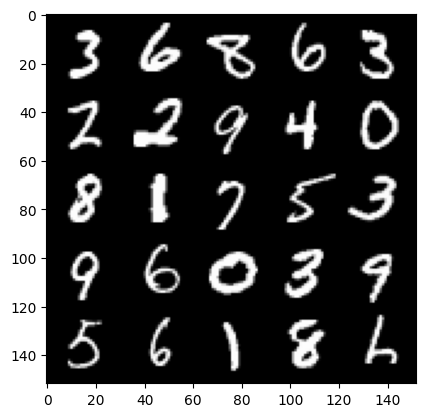

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.8487300114631657, discriminator loss: 0.11409801971912378


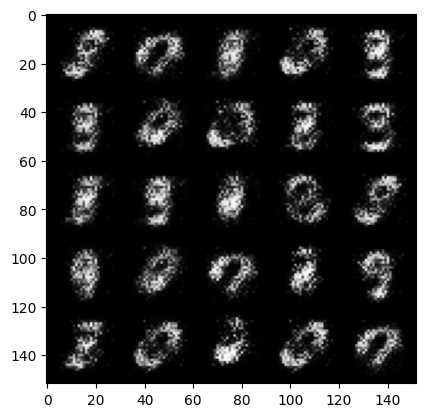

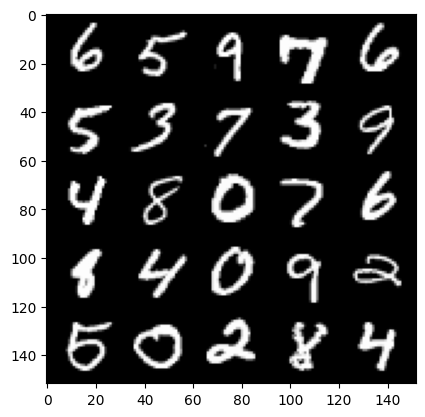

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.3002419738769526, discriminator loss: 0.08297716362029316


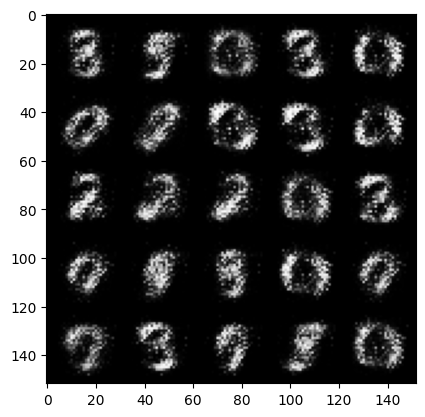

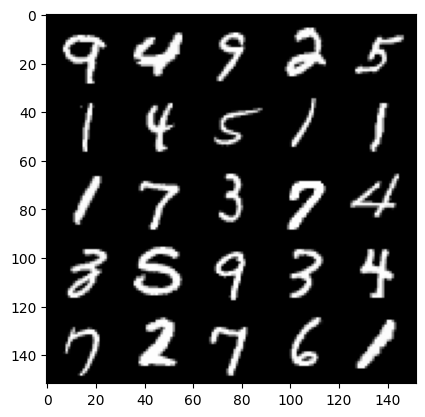

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.582594852924349, discriminator loss: 0.07058703749626878


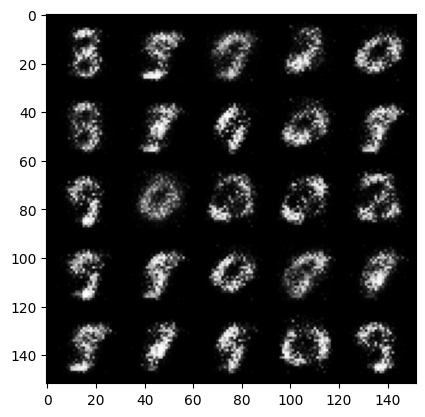

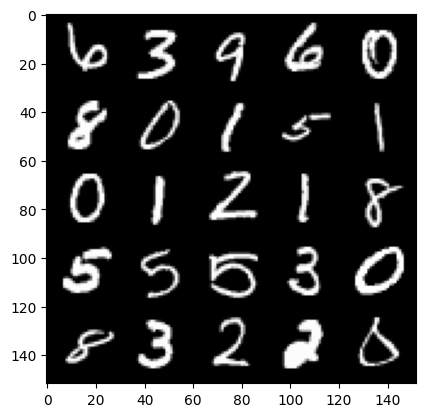

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.6602706518173207, discriminator loss: 0.07355487468838683


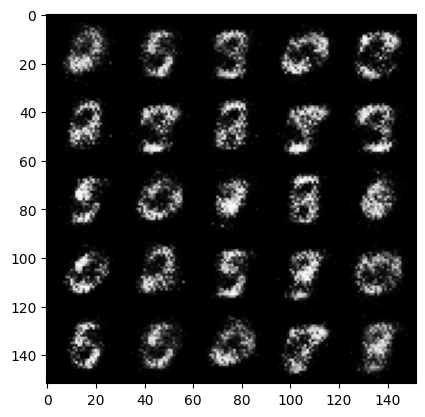

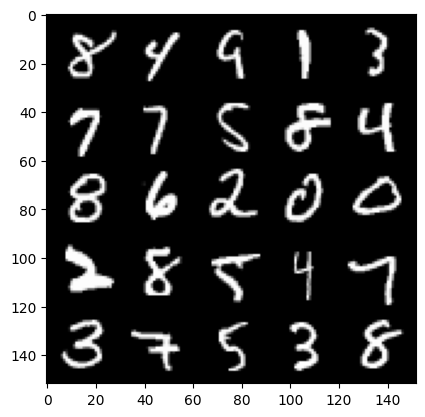

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.7583549151420566, discriminator loss: 0.08148803651332853


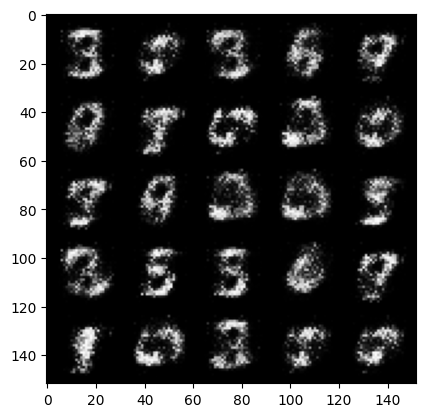

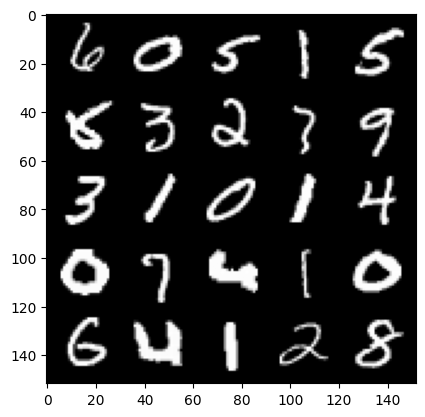

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.8566484031677244, discriminator loss: 0.061788748994469636


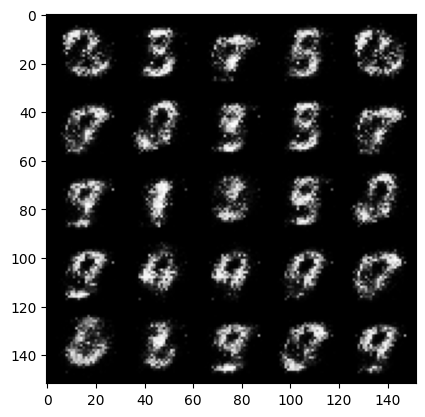

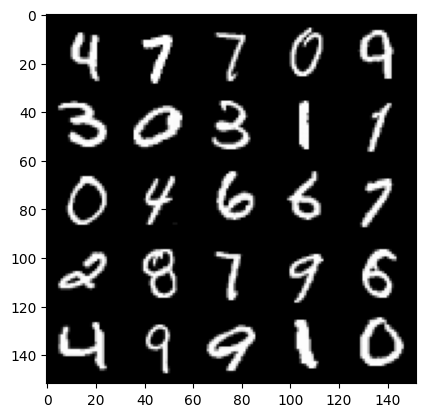

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.263654893398283, discriminator loss: 0.05737783601507547


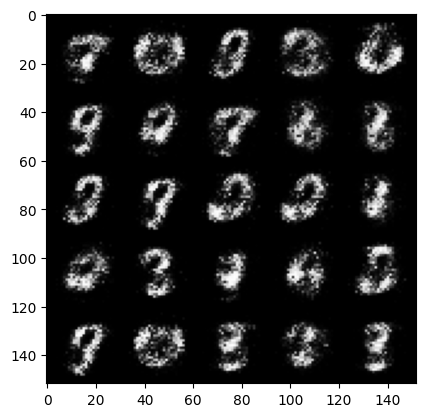

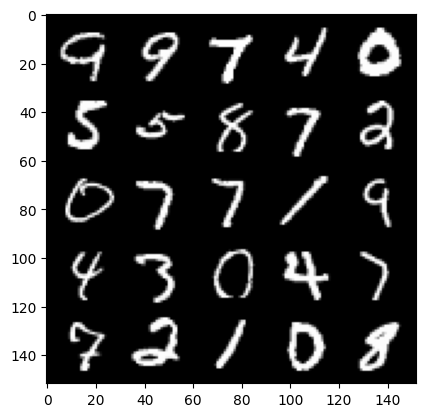

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.1518092341423, discriminator loss: 0.06234160405397419


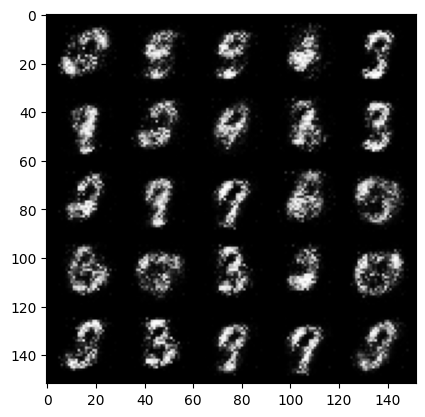

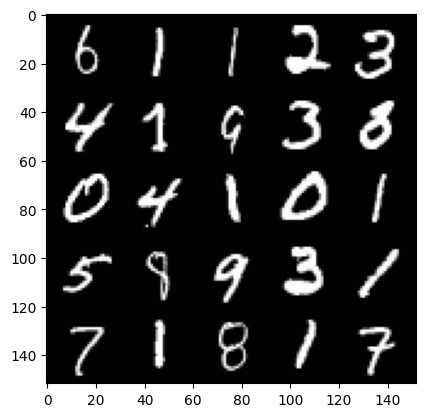

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.129462792396546, discriminator loss: 0.060853947453200774


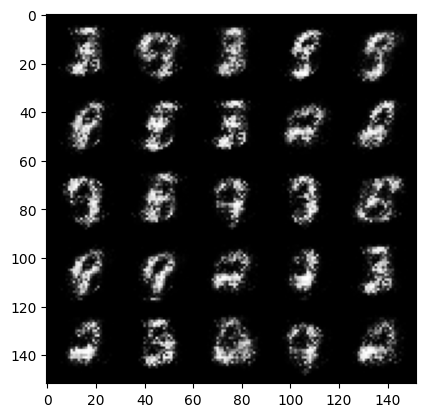

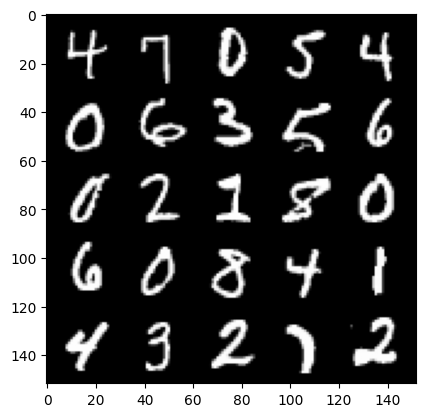

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 3.9966438059806855, discriminator loss: 0.06037141886726029


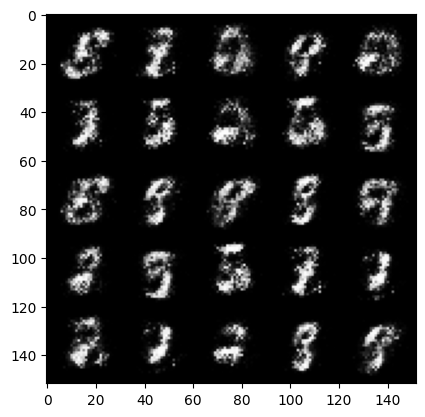

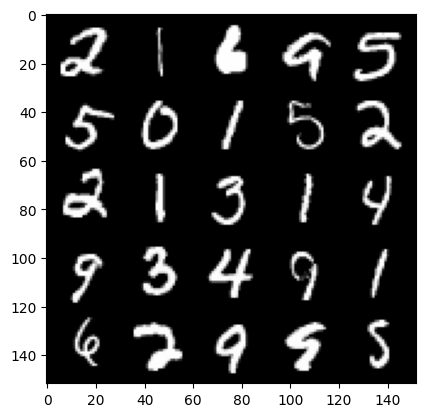

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.144310703277585, discriminator loss: 0.06238790784776211


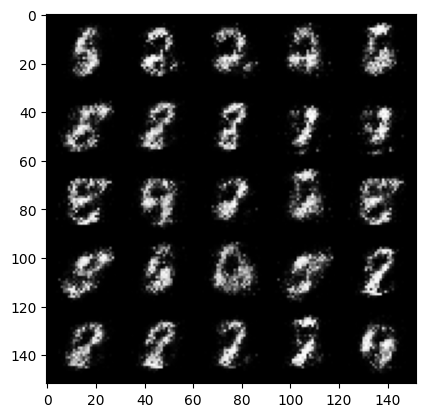

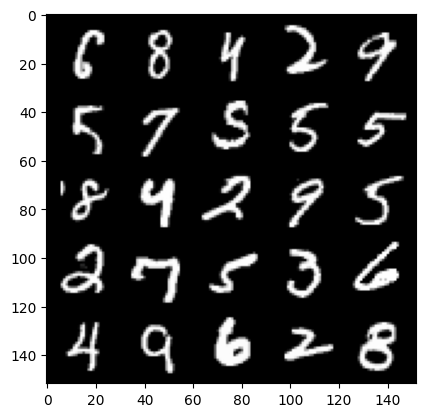

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.1250826330184935, discriminator loss: 0.0682136218436063


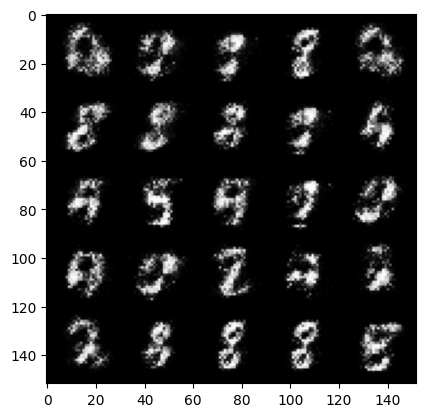

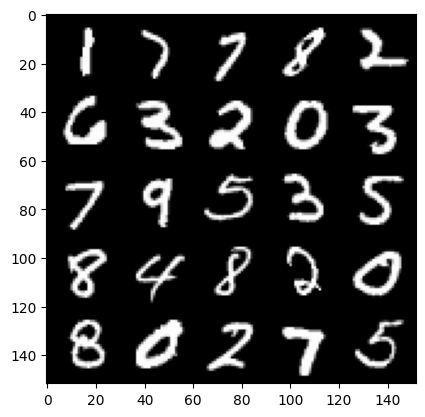

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.00337475442886, discriminator loss: 0.07554200148582464


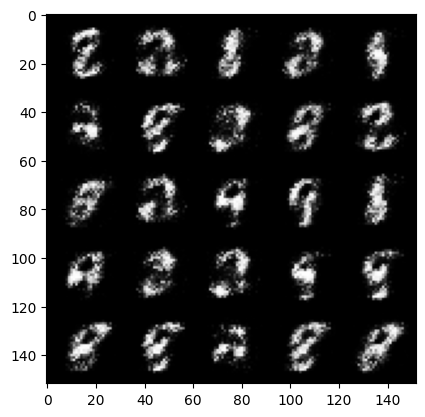

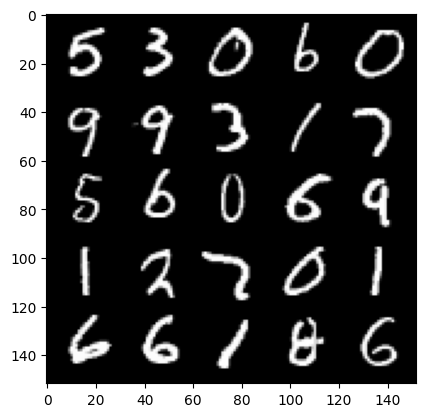

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 3.958298701286312, discriminator loss: 0.07688185872882604


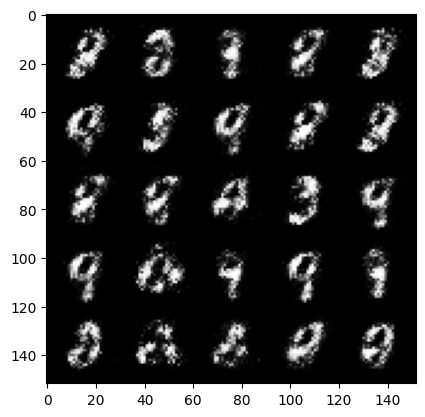

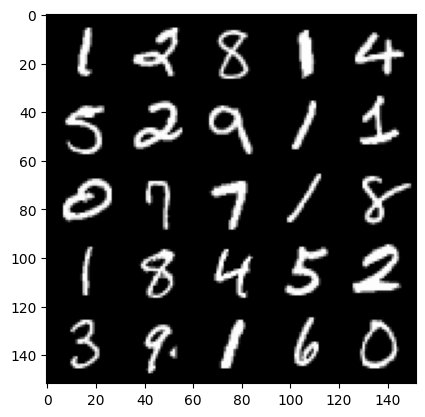

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.162253509998326, discriminator loss: 0.08303997014462948


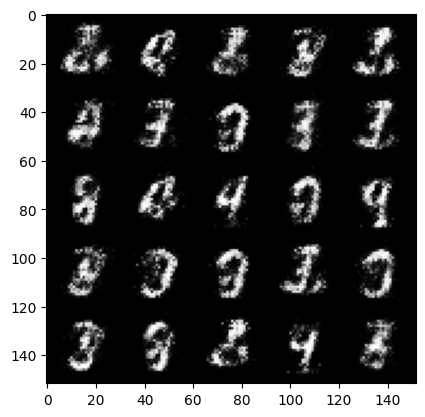

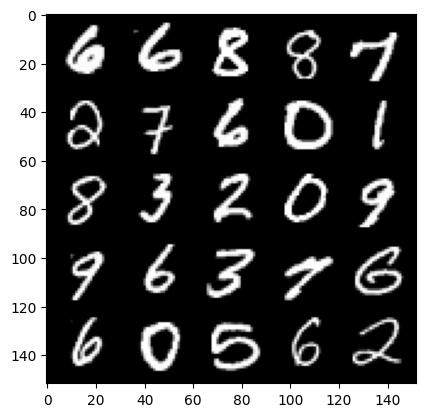

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 3.9827539434432984, discriminator loss: 0.08850975442677735


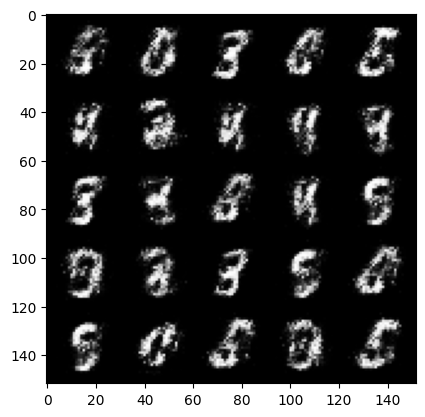

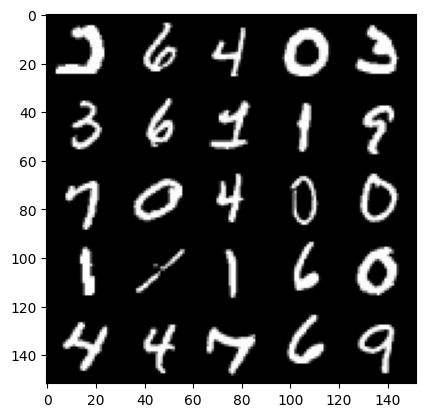

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 3.7729147953987106, discriminator loss: 0.10028090652078386


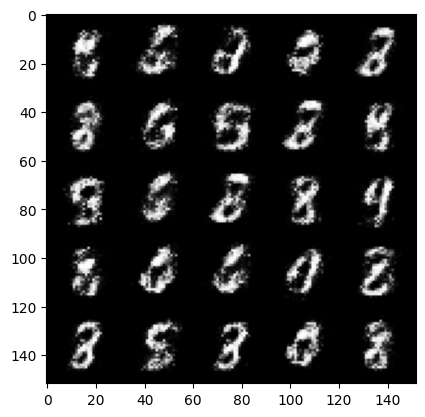

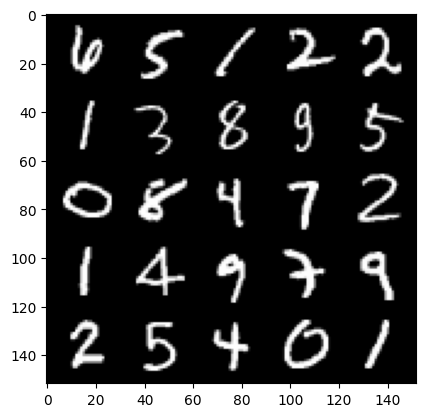

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 3.7067834916114824, discriminator loss: 0.1001003608107566


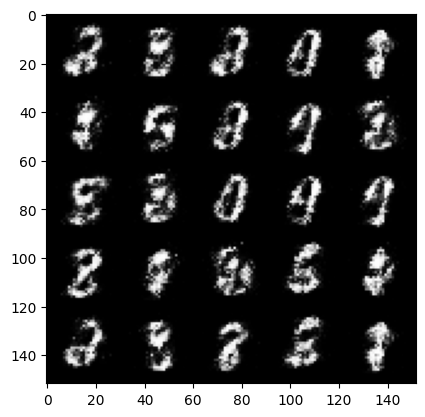

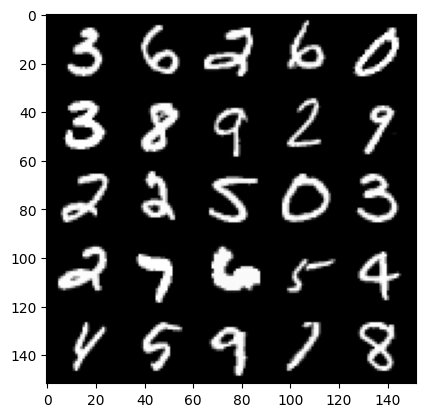

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 3.6649190349578875, discriminator loss: 0.10575602184236041


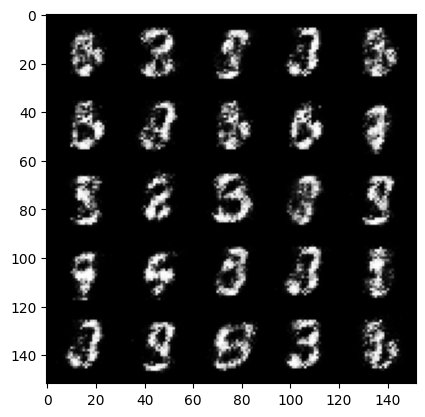

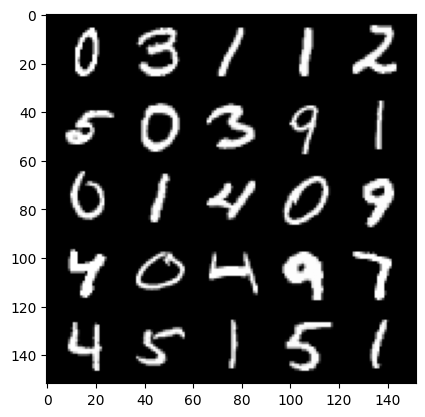

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 3.754733104228972, discriminator loss: 0.10341320063918831


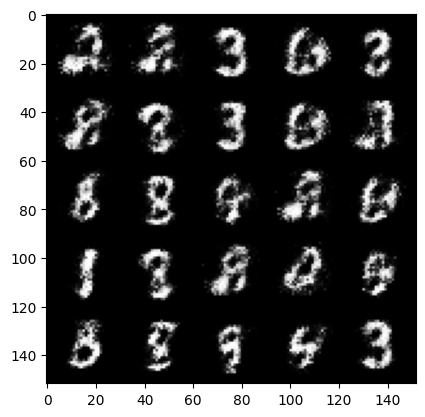

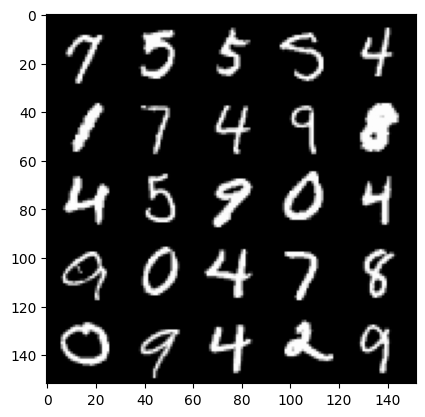

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 3.787820255279539, discriminator loss: 0.103652000874281


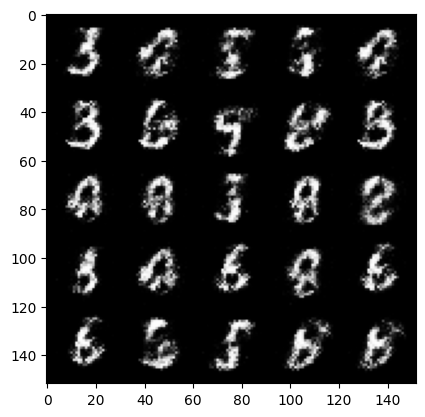

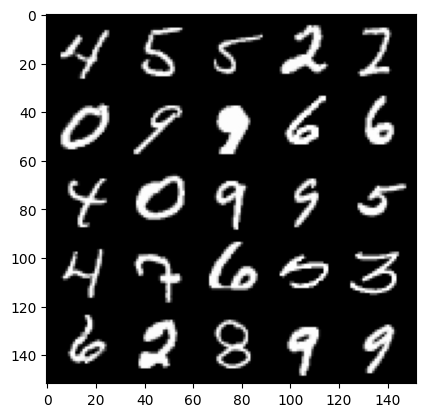

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.8238278551101677, discriminator loss: 0.10866807138174778


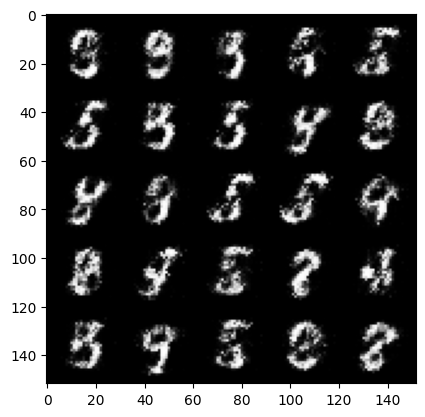

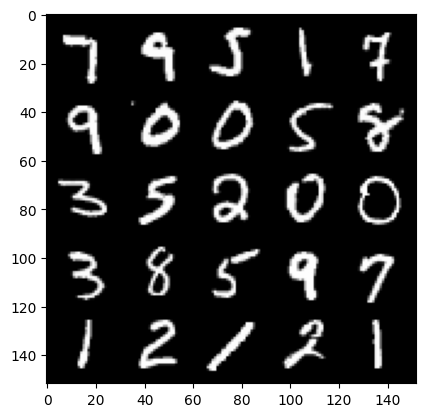

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.6301382460594174, discriminator loss: 0.11358658683300013


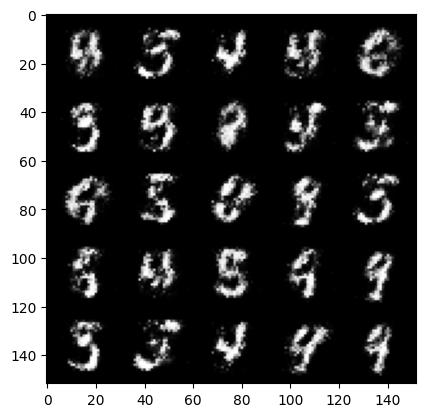

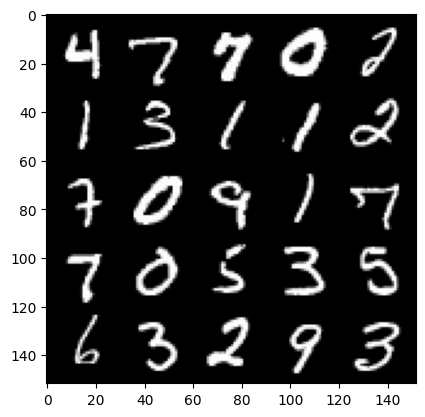

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.543391266345981, discriminator loss: 0.11953232870995993


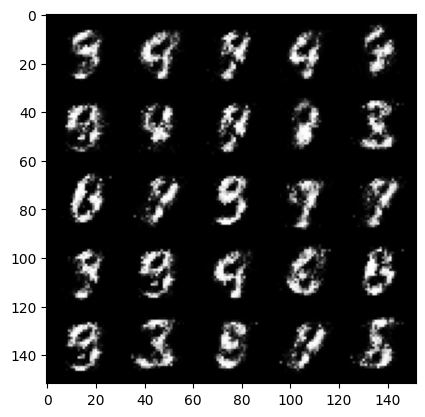

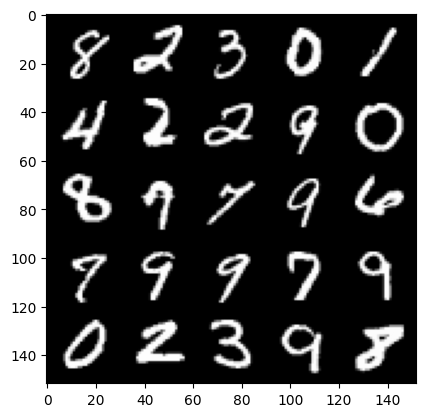

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.435553749084473, discriminator loss: 0.13592214423418034


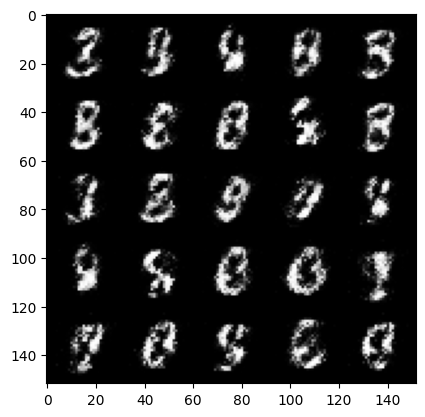

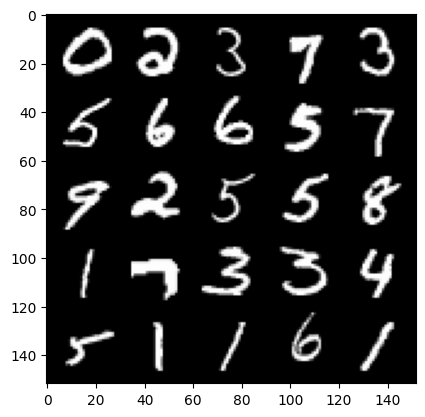

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.313936201095583, discriminator loss: 0.1460230126231909


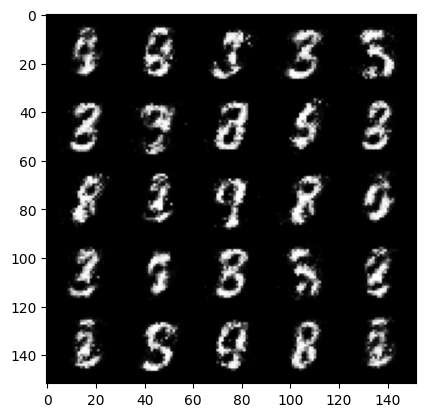

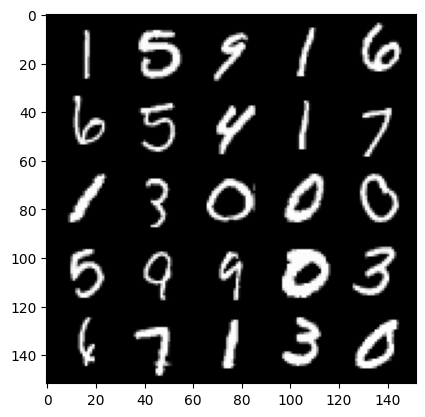

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.340297828674316, discriminator loss: 0.14390338623523713


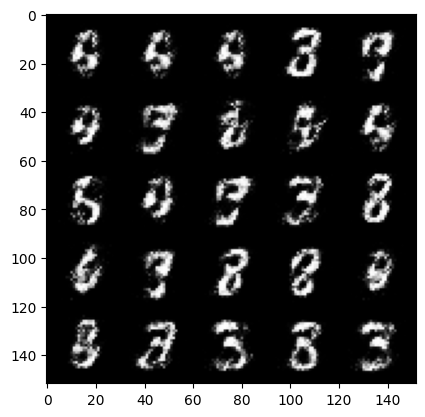

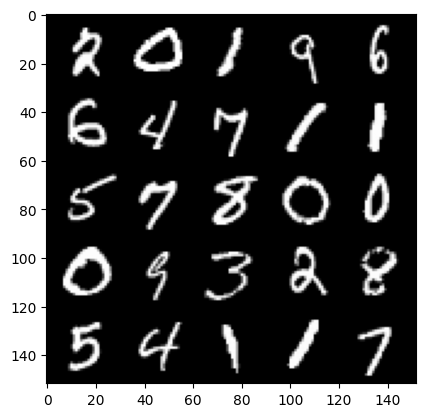

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.339644172668459, discriminator loss: 0.1527391042262314


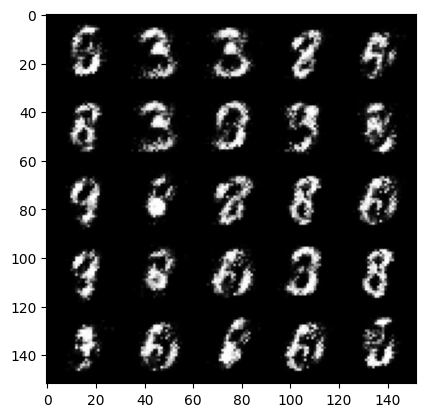

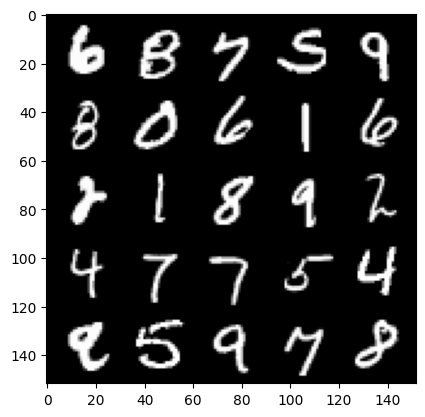

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.135409822940827, discriminator loss: 0.1679044743925331


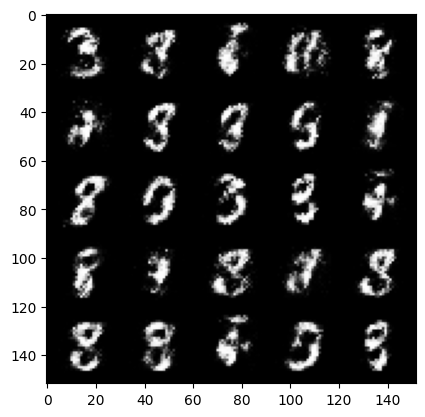

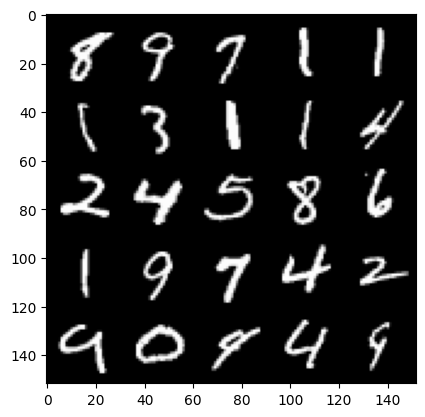

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.0517975463867146, discriminator loss: 0.16534126451611517


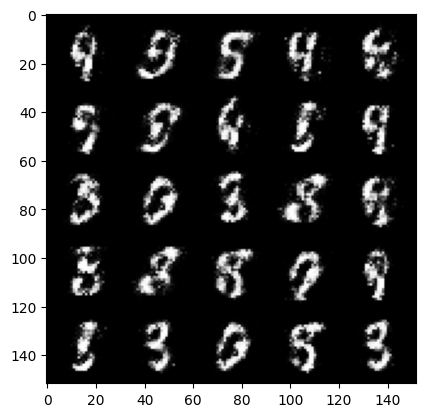

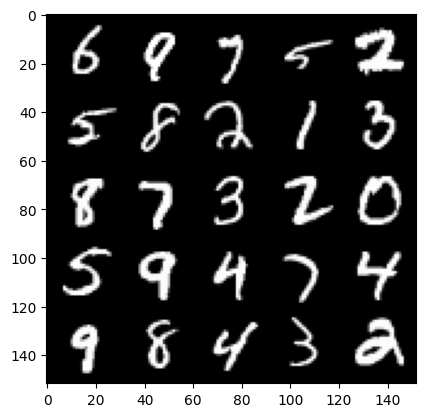

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.0680784702301023, discriminator loss: 0.17465487203001961


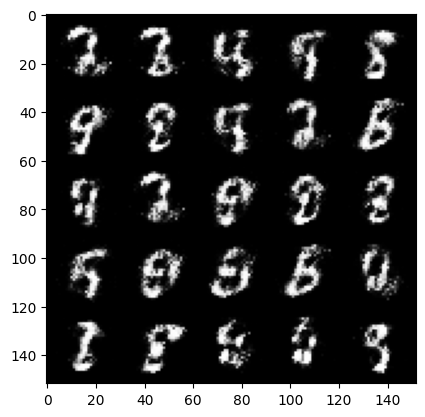

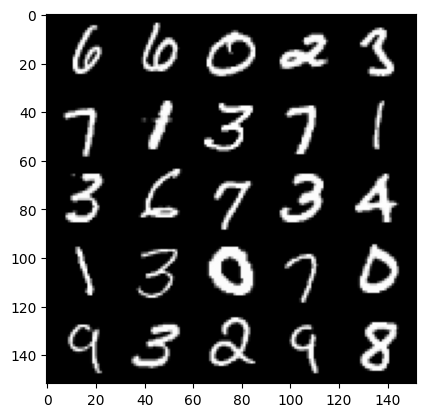

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.1891921353340136, discriminator loss: 0.16836197917163379


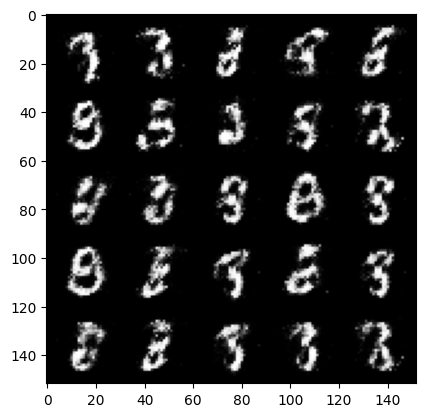

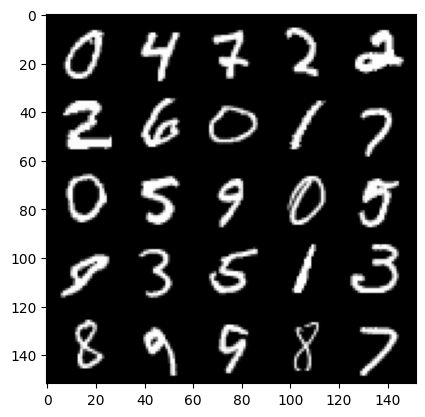

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.1435440788269036, discriminator loss: 0.17630453538894642


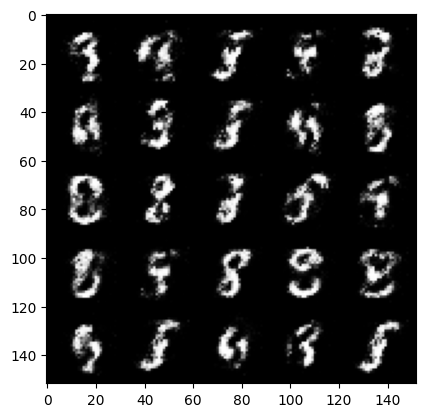

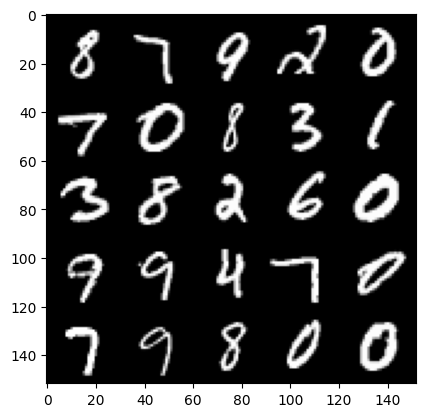

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 2.9129797964096067, discriminator loss: 0.18625928428769126


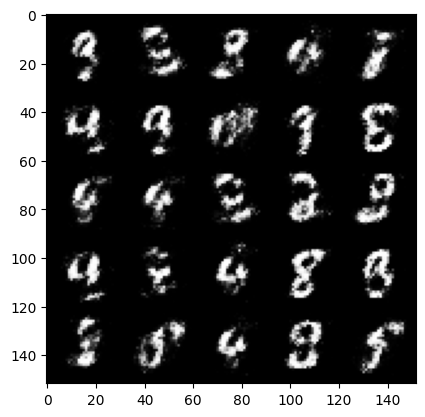

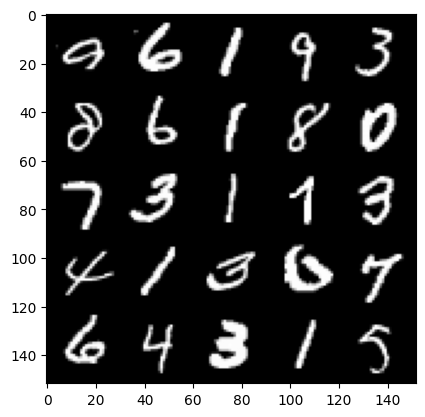

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 2.806923751831057, discriminator loss: 0.19330766278505318


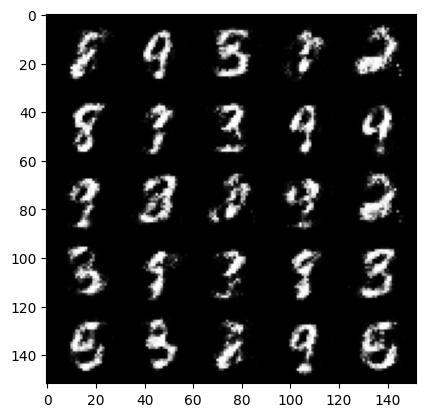

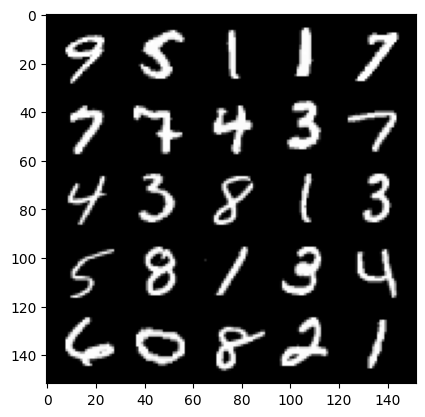

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 2.868527295112611, discriminator loss: 0.19278246837854382


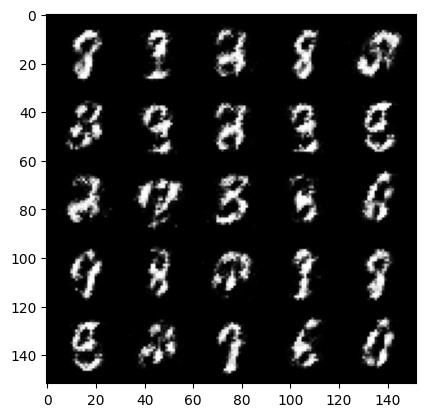

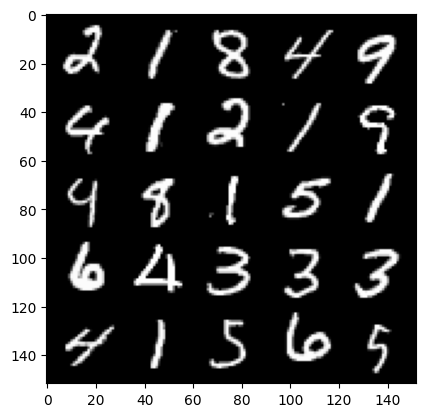

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 2.784028117656708, discriminator loss: 0.20153733497858034


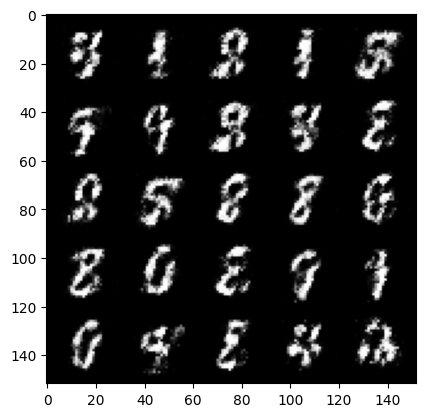

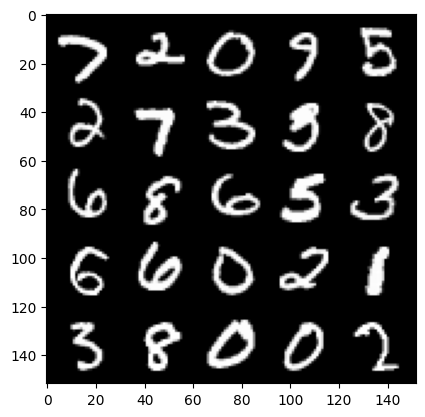

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 2.745421009063722, discriminator loss: 0.19839975638687624


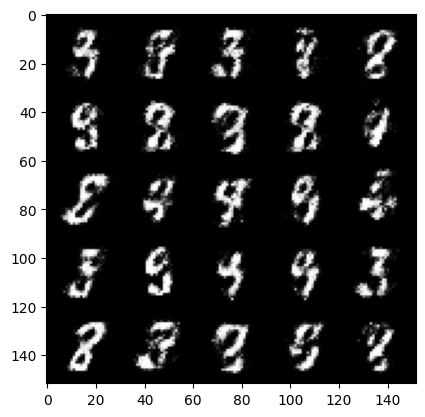

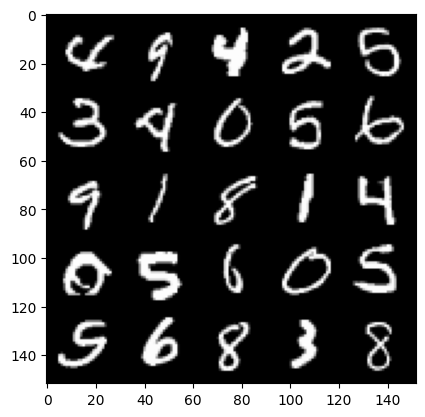

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 2.762622361660002, discriminator loss: 0.20707115544378757


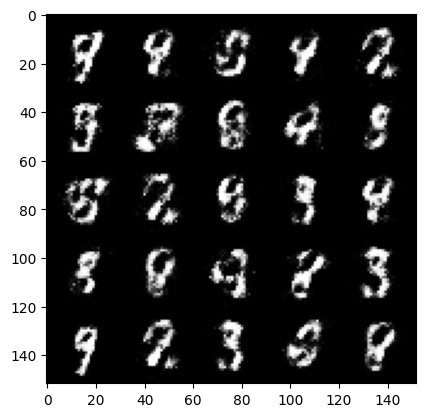

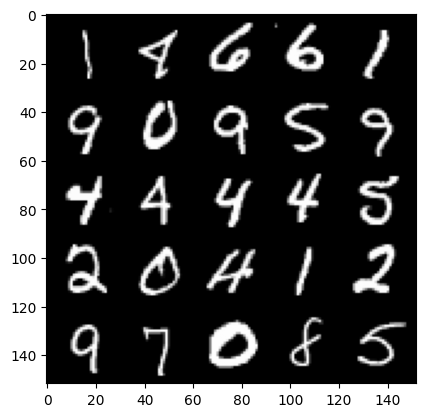

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 2.7751314578056347, discriminator loss: 0.20412792946398267


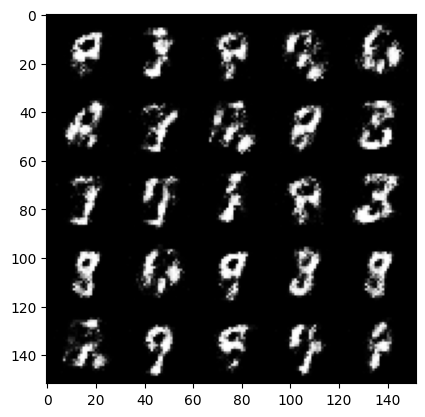

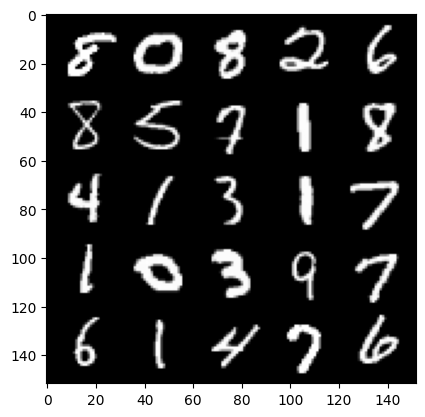

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 2.745493672370912, discriminator loss: 0.21403052192926394


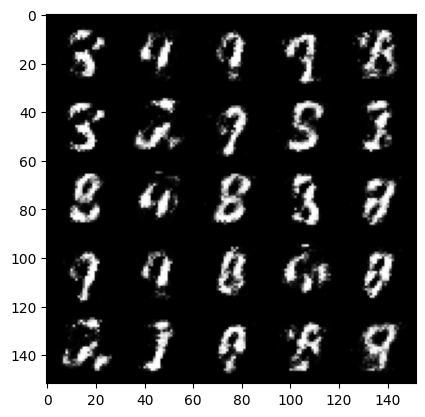

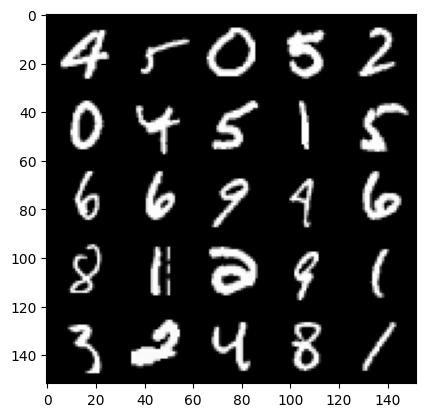

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.7976087369918843, discriminator loss: 0.20539893895387637


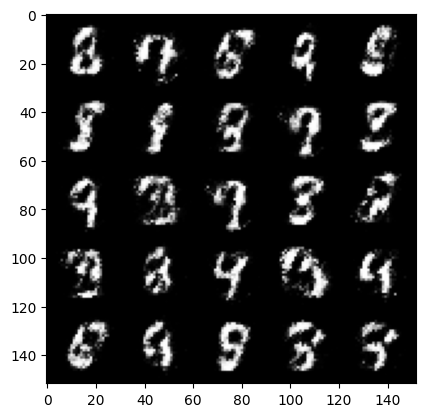

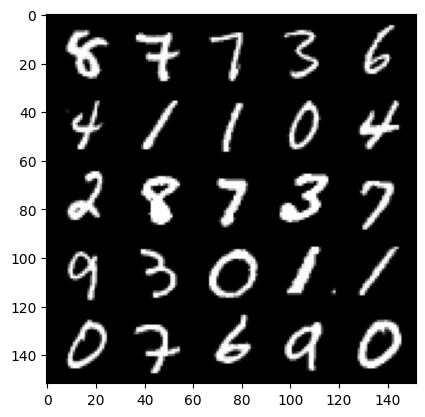

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.795254318714143, discriminator loss: 0.20032648999989053


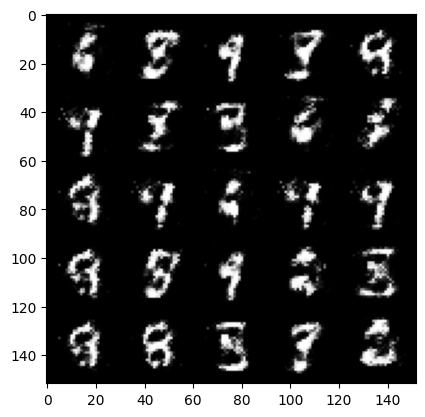

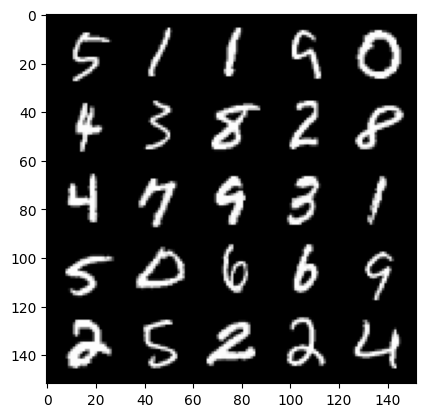

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9087600741386423, discriminator loss: 0.18703137122094626


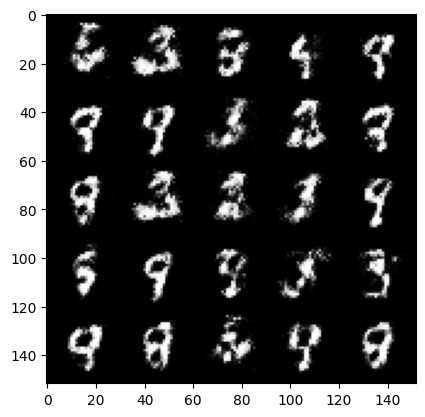

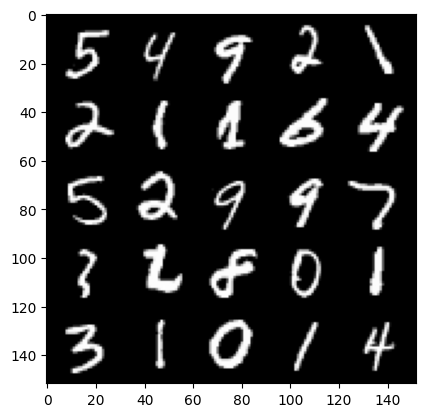

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.823557764053344, discriminator loss: 0.18783770558238022


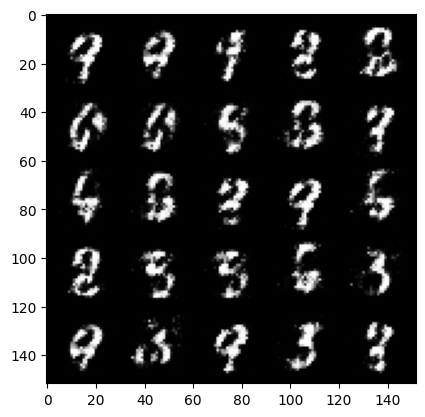

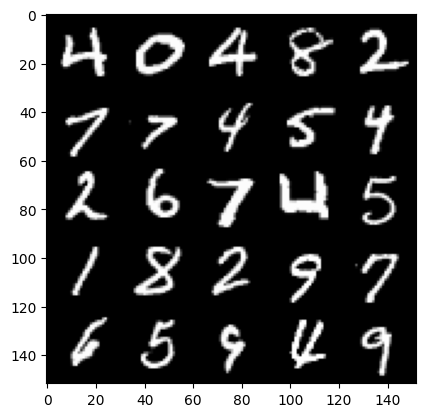

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.756643147468564, discriminator loss: 0.2068330007195473


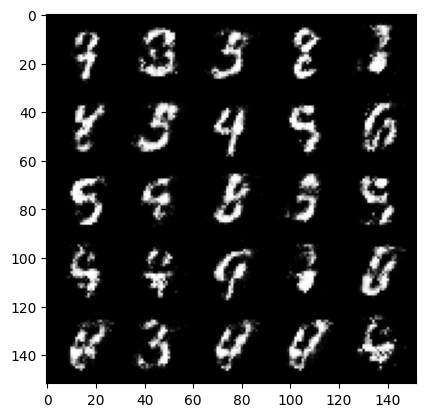

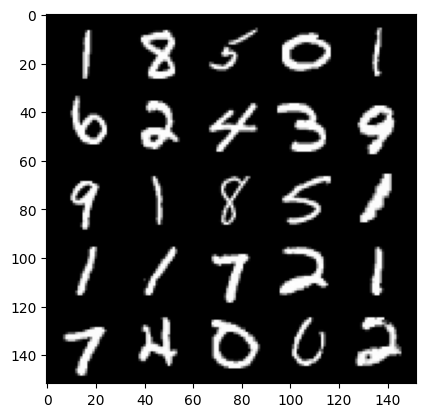

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.6542009387016283, discriminator loss: 0.21636397862434364


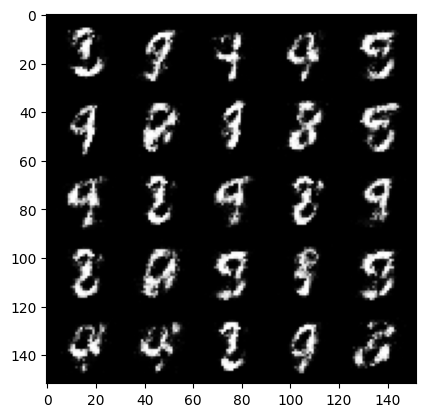

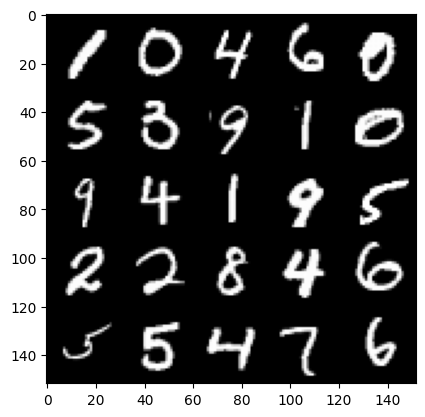

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.595915605545046, discriminator loss: 0.22471882197260856


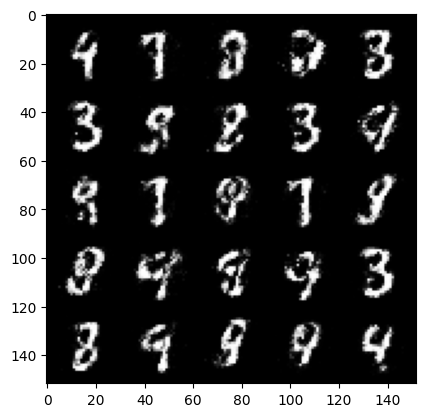

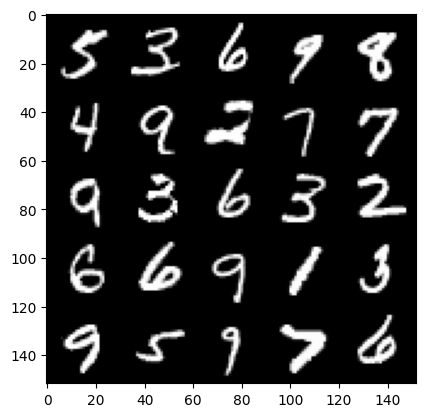

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.5146942362785345, discriminator loss: 0.24788500994443888


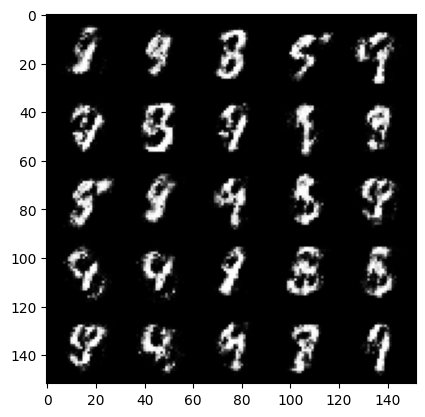

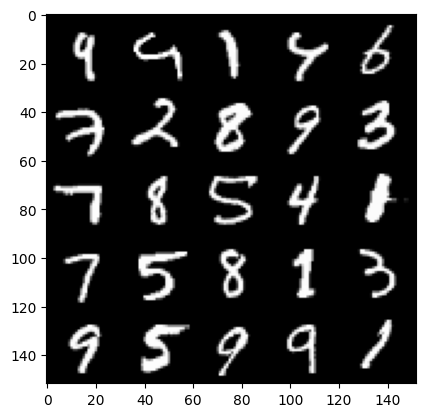

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.520844610214233, discriminator loss: 0.23221939489245422


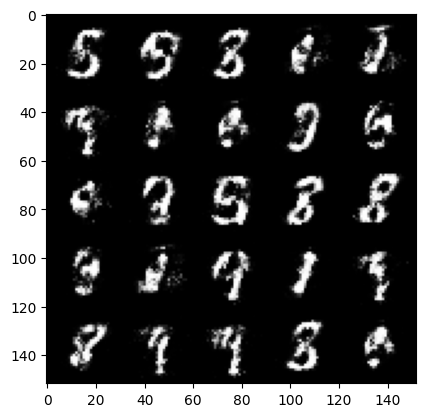

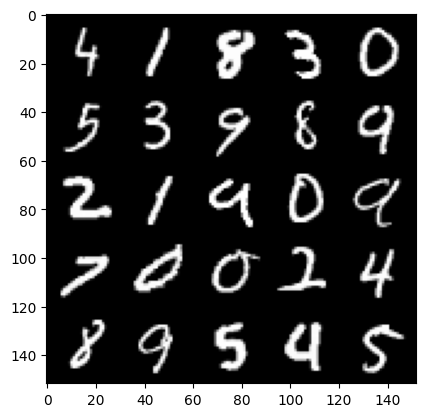

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.5822548956871043, discriminator loss: 0.22377412936091423


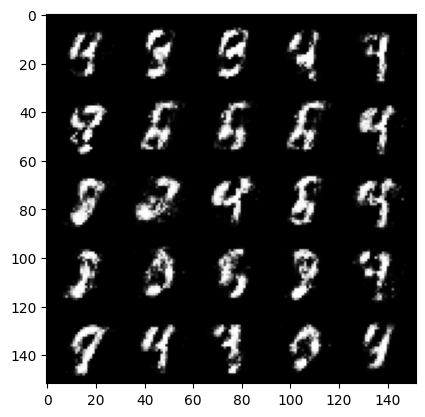

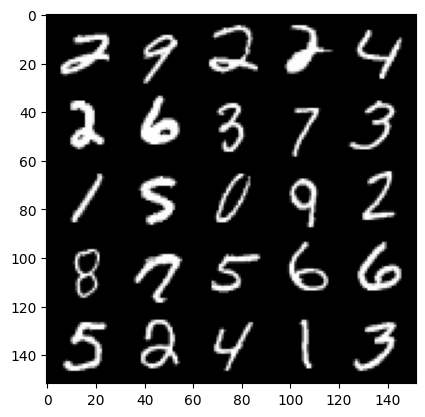

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.5359784617424004, discriminator loss: 0.22642180821299568


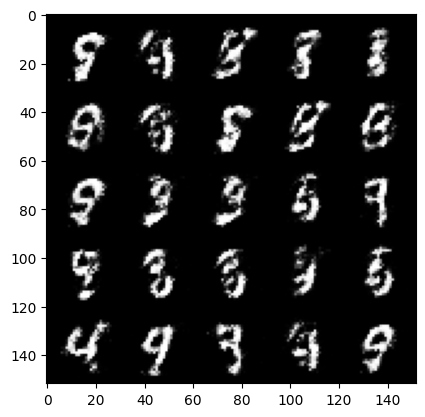

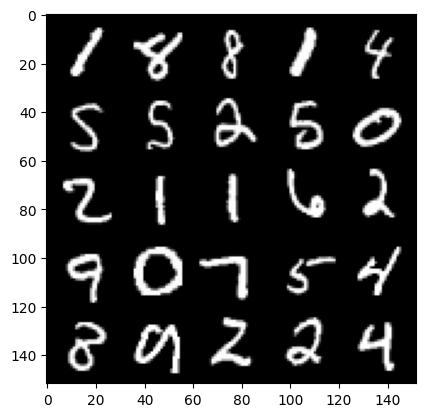

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.6231610789299027, discriminator loss: 0.22635751631855971


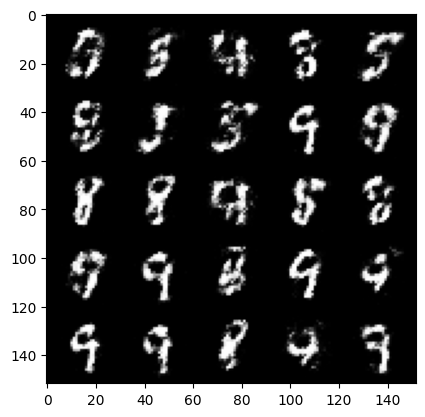

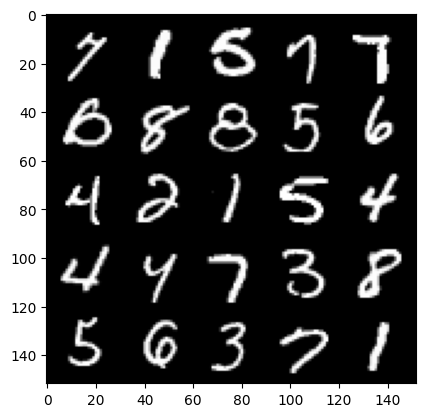

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.4374987390041376, discriminator loss: 0.2555279949605465


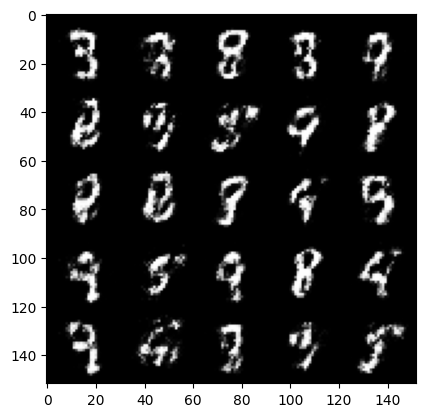

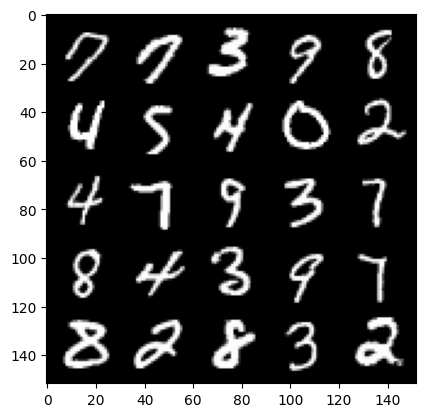

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.4941605734825156, discriminator loss: 0.23332514953613262


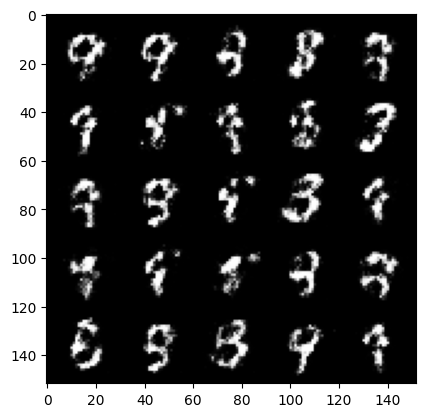

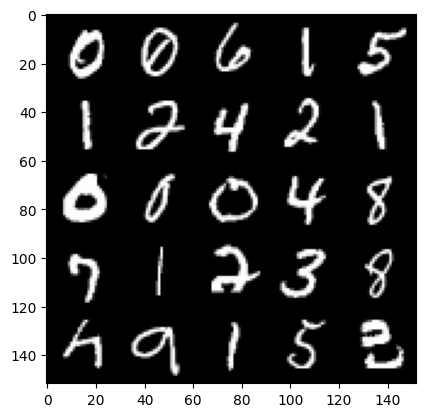

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.423355007648468, discriminator loss: 0.2588036438524723


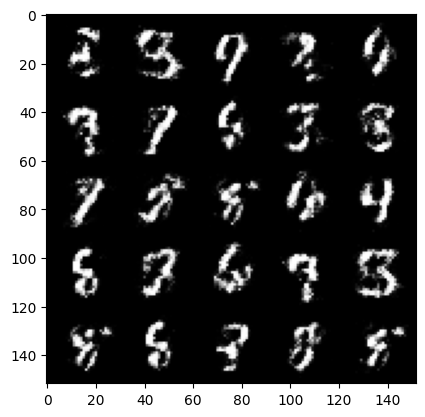

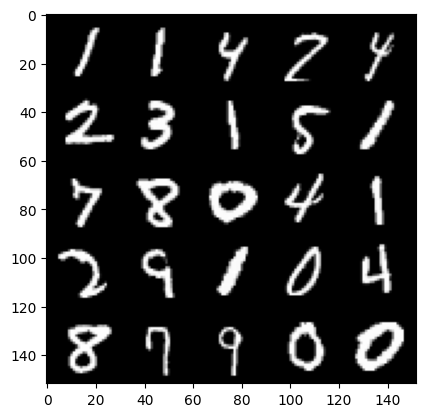

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.3182563705444363, discriminator loss: 0.2642381297945976


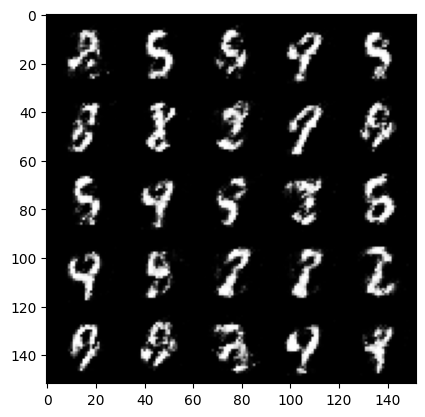

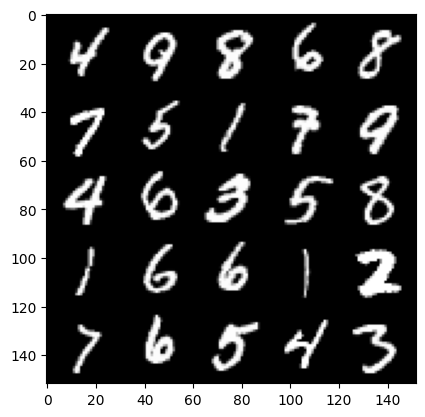

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.3544372696876508, discriminator loss: 0.25677362853288654


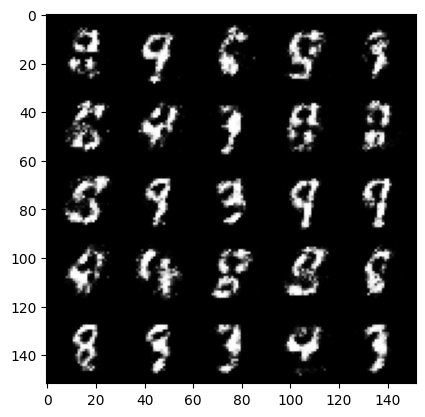

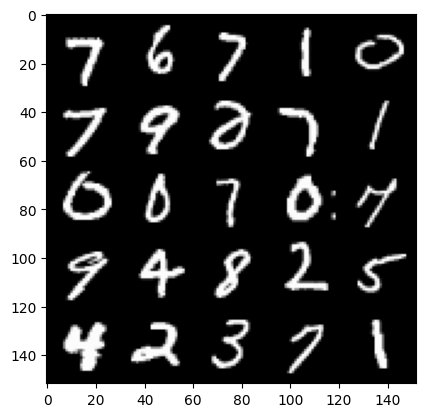

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.275878616571425, discriminator loss: 0.2797557999193669


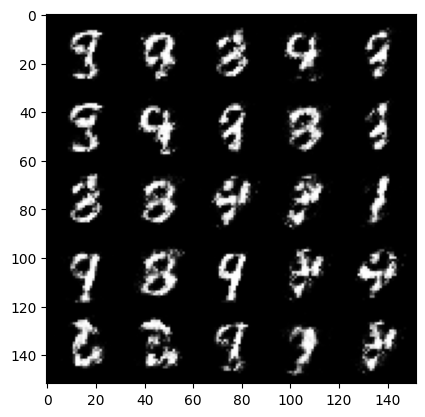

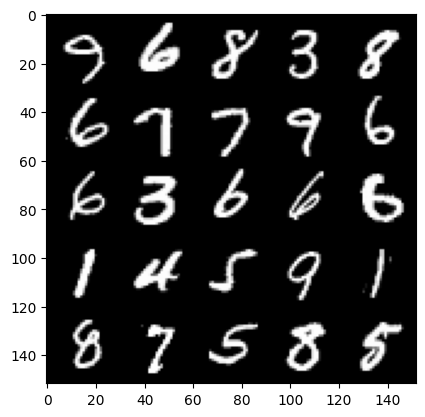

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.279508365154264, discriminator loss: 0.2696113871335984


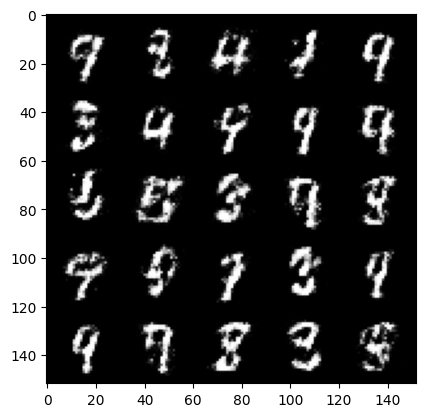

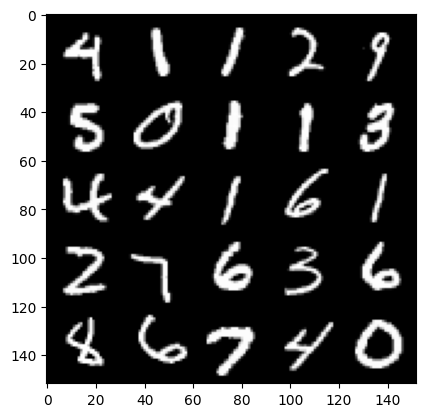

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.172199917078019, discriminator loss: 0.2999794288277629


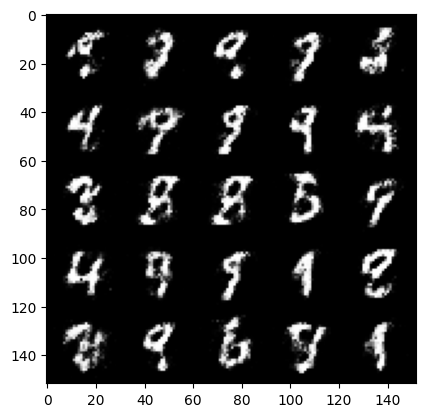

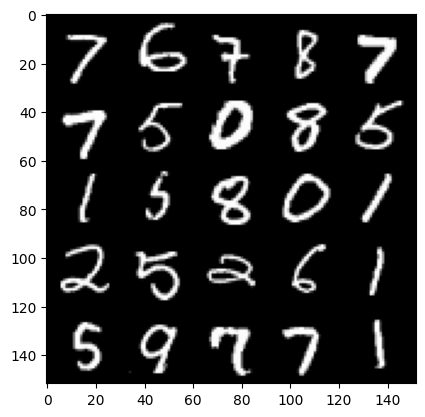

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.1217426562309285, discriminator loss: 0.2870789697468282


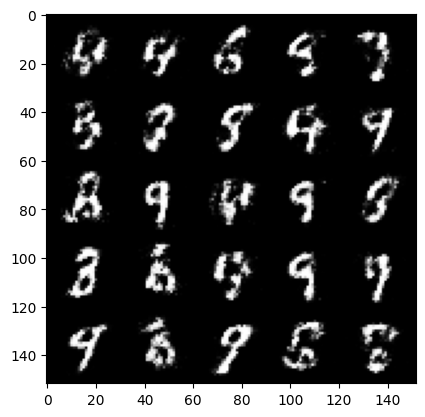

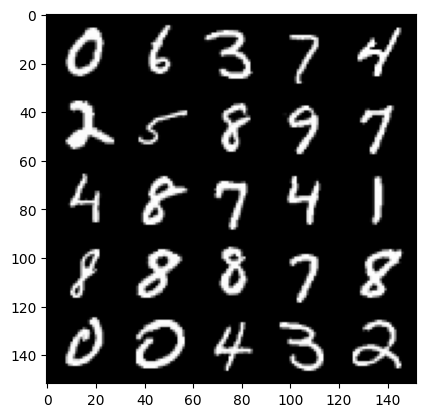

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.297197754383085, discriminator loss: 0.2585350894629954


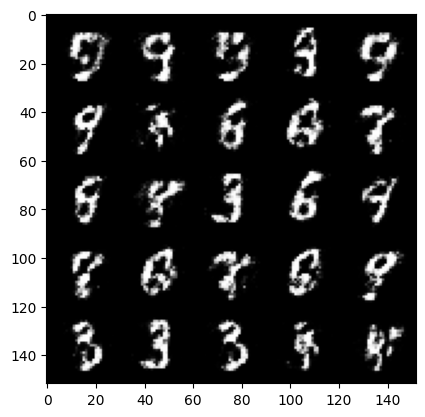

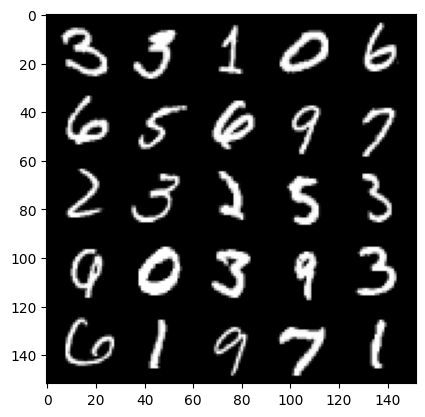

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.279319592714309, discriminator loss: 0.2712650223076344


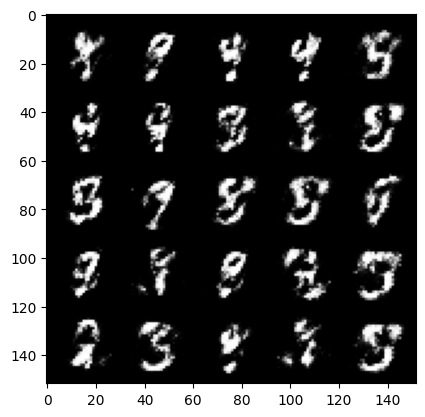

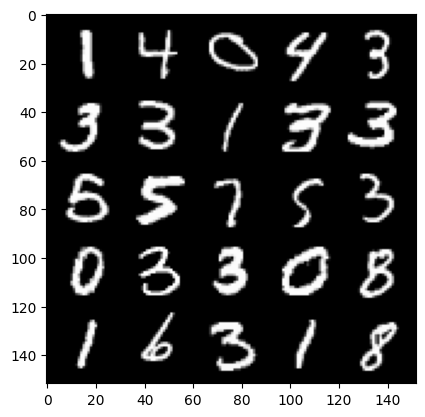

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.266198968887328, discriminator loss: 0.27362708091735816


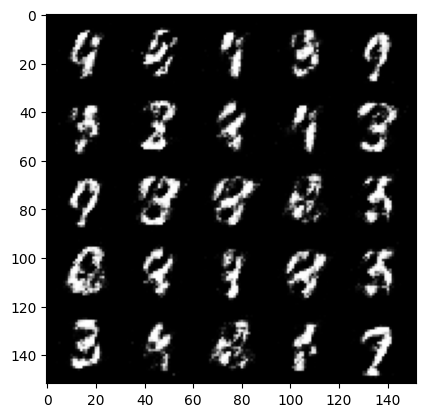

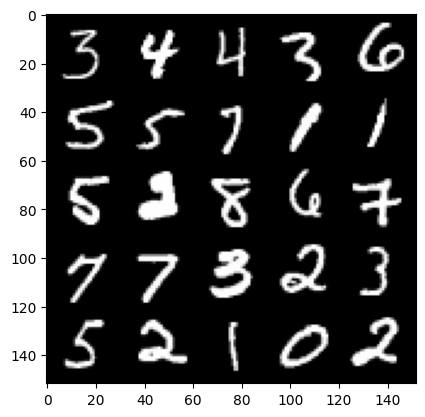

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.3088137121200565, discriminator loss: 0.256876069933176


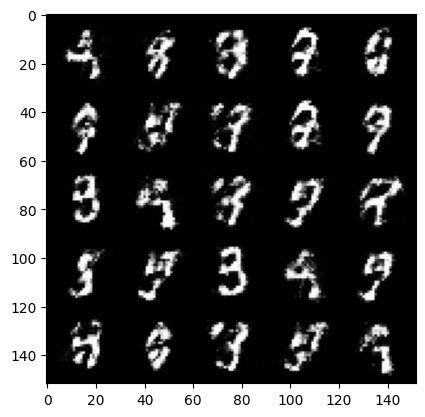

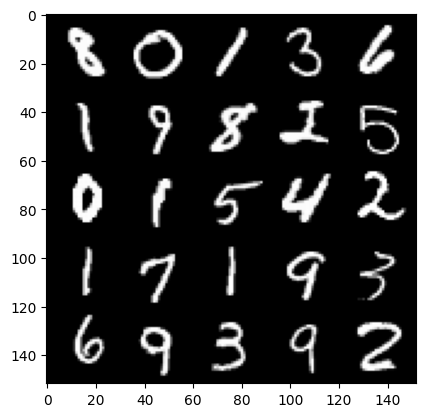

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.2938918504714922, discriminator loss: 0.27331146699190134


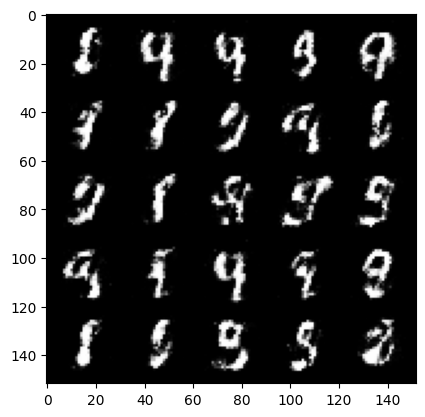

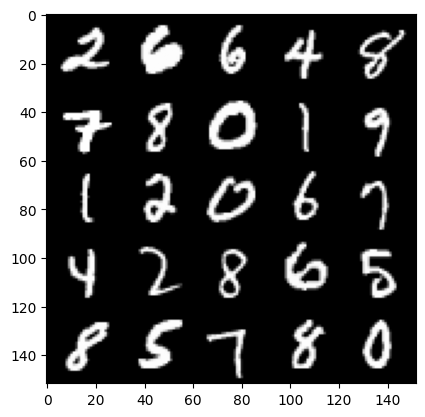

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.183899411439893, discriminator loss: 0.28374523180723193


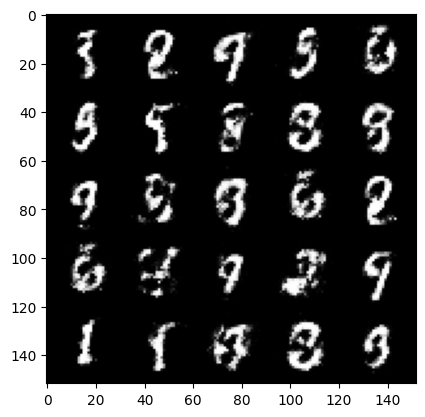

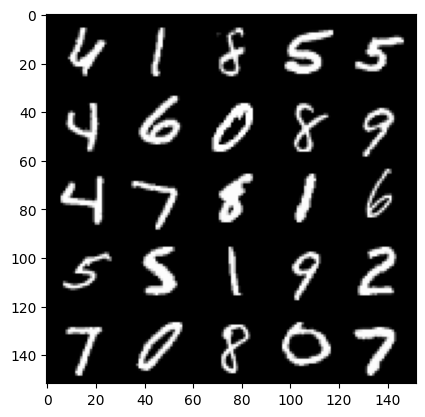

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.203120111703871, discriminator loss: 0.28255089458823207


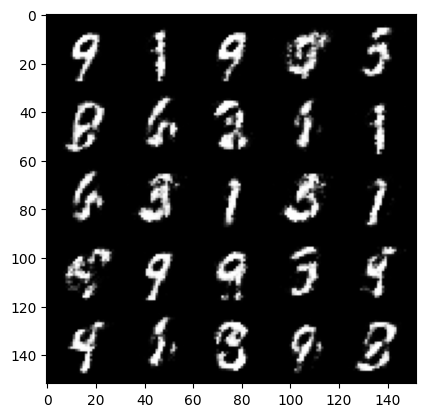

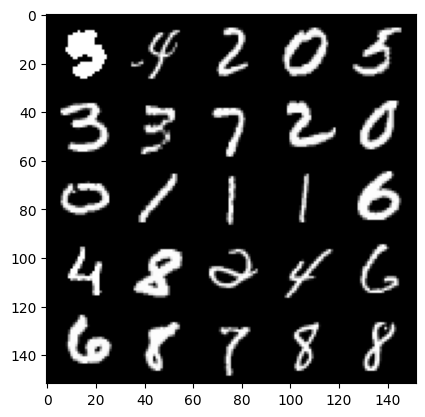

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.0472034637928007, discriminator loss: 0.3014001635313032


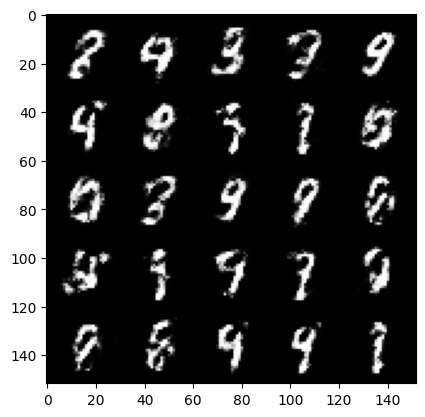

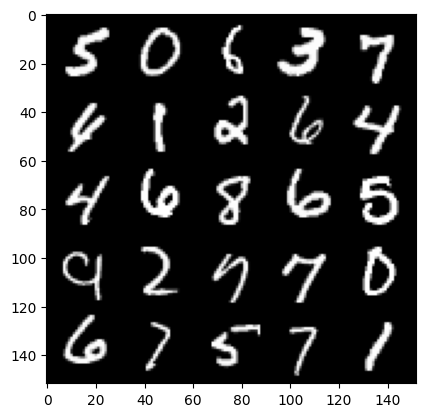

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.071305668354035, discriminator loss: 0.29648112165927903


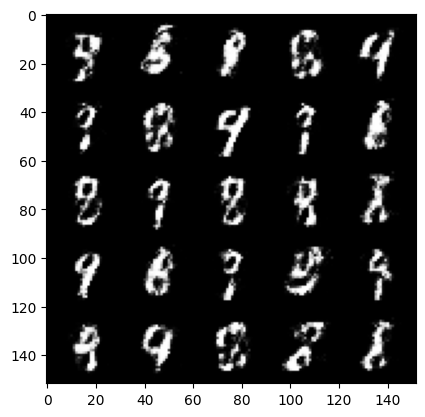

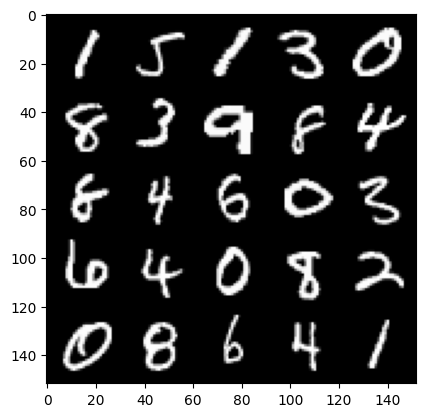

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.0574926505088804, discriminator loss: 0.3121702026426793


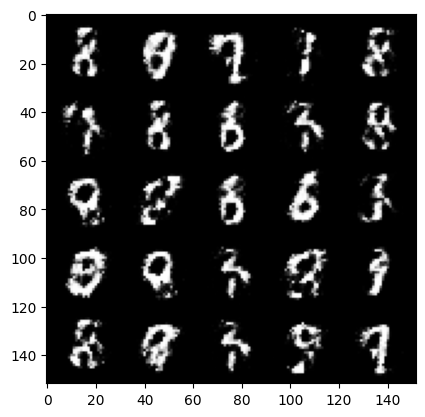

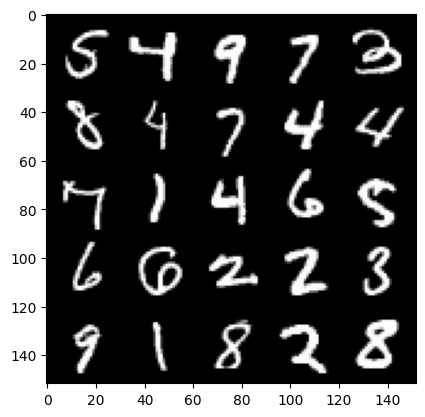

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.0456955554485305, discriminator loss: 0.30210846257209767


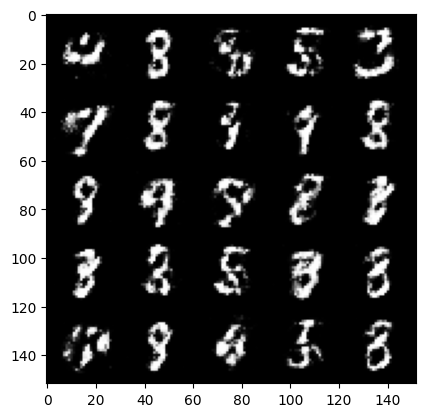

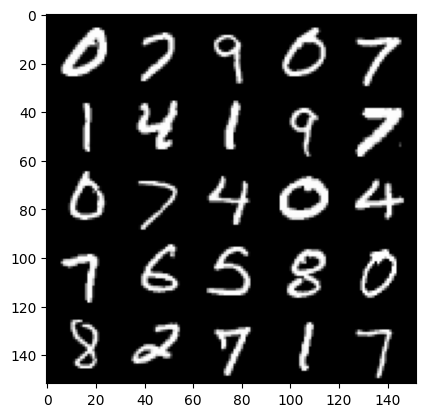

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.1078570361137428, discriminator loss: 0.29453679558634766


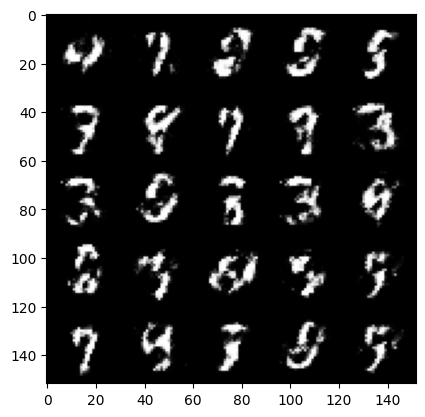

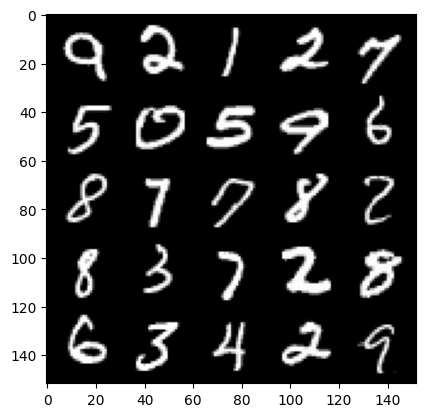

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.017122759342195, discriminator loss: 0.3130774466693399


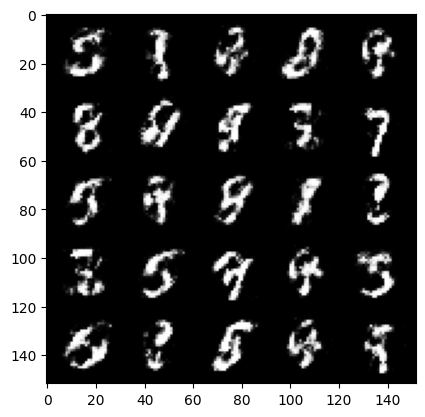

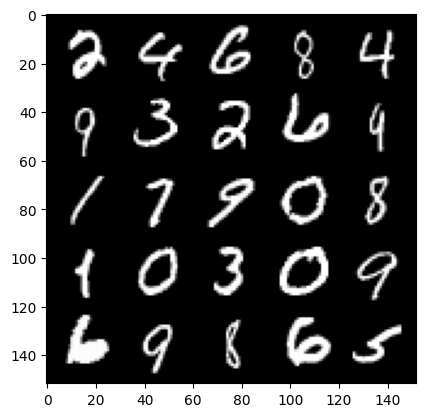

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 1.9995771353244784, discriminator loss: 0.3106042904853821


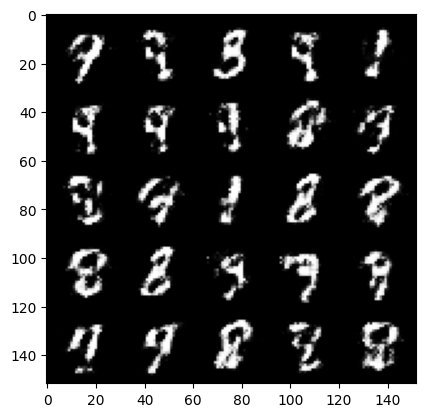

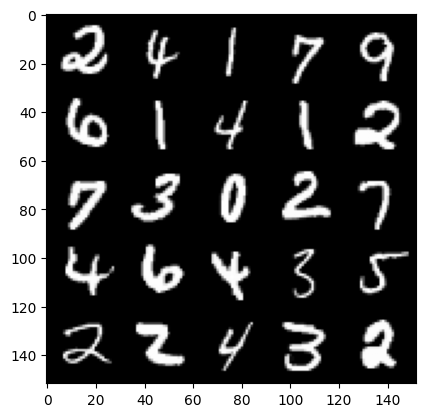

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 1.9312394144535063, discriminator loss: 0.3346157025694846


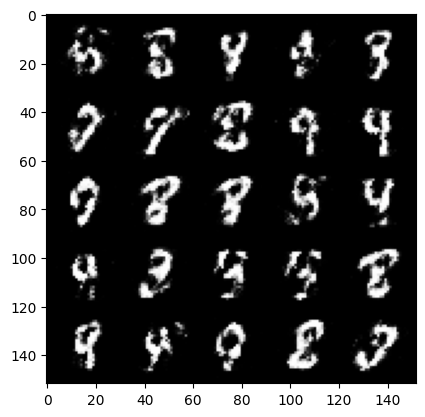

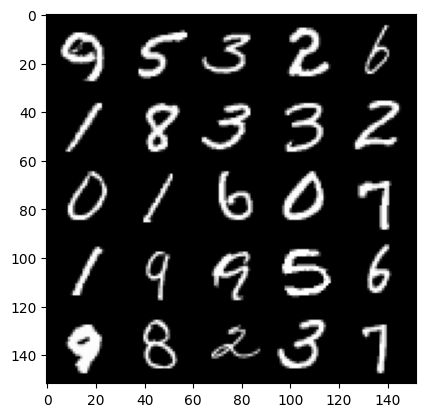

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 1.9097549939155578, discriminator loss: 0.33328908804059043


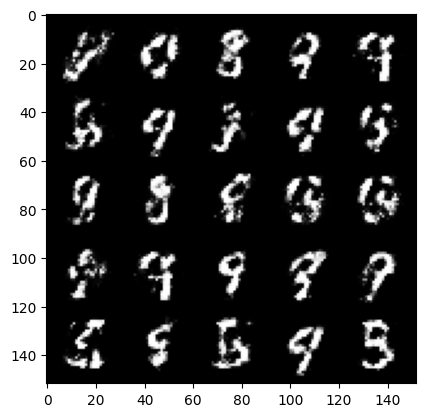

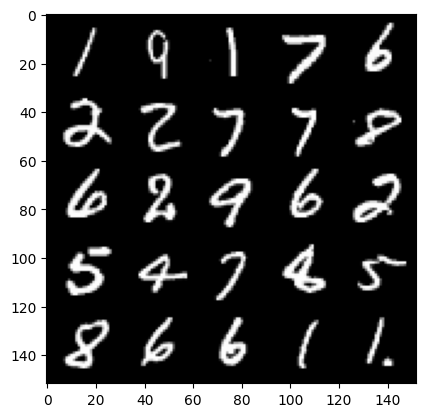

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.0205970482826237, discriminator loss: 0.3019342027306558


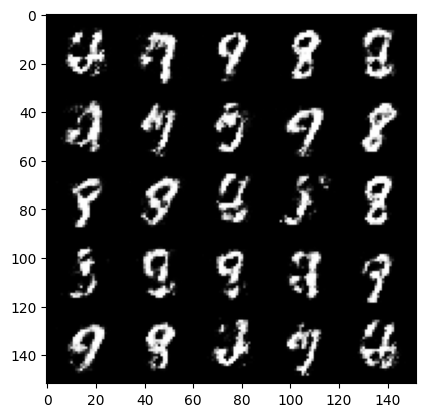

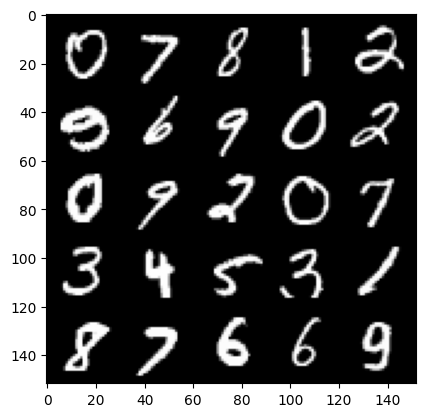

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.0325113978385936, discriminator loss: 0.3093610617518423


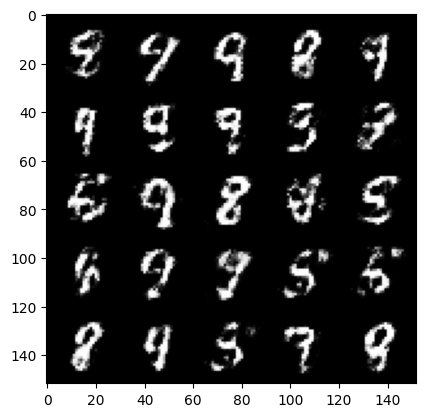

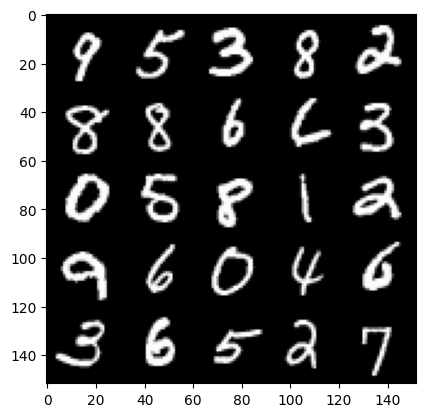

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 1.8481597192287451, discriminator loss: 0.3512628837227823


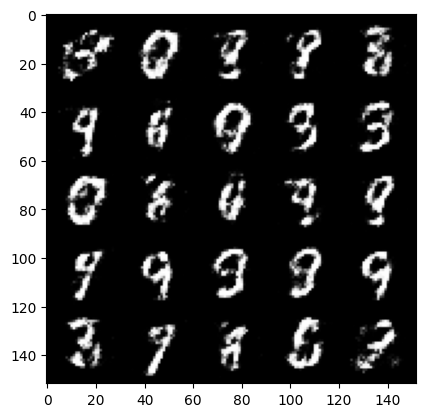

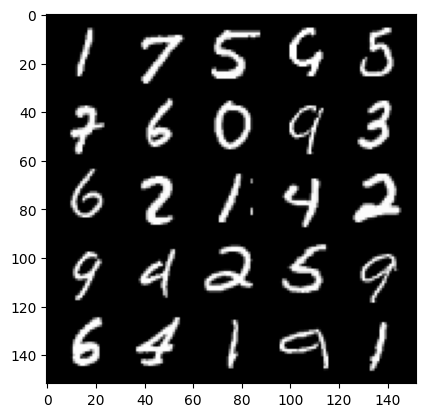

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 1.8523342192172998, discriminator loss: 0.3462425875067714


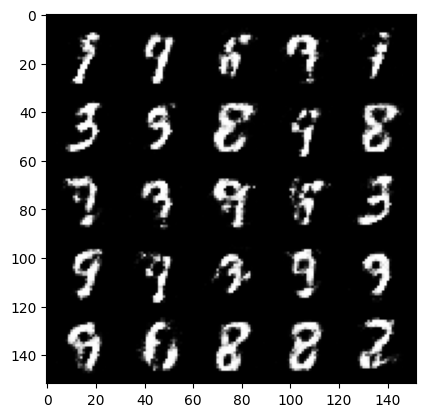

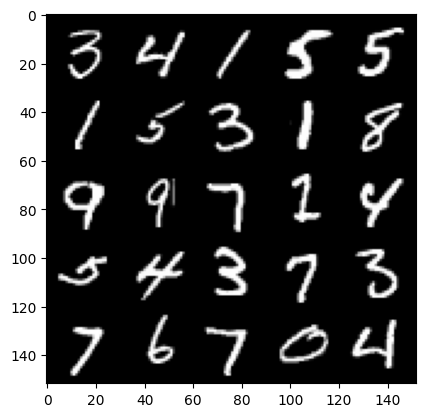

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 1.8772925853729239, discriminator loss: 0.32965750852227244


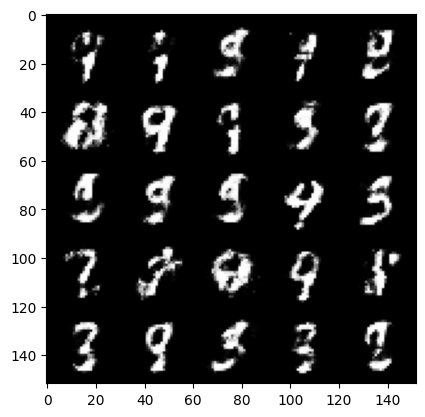

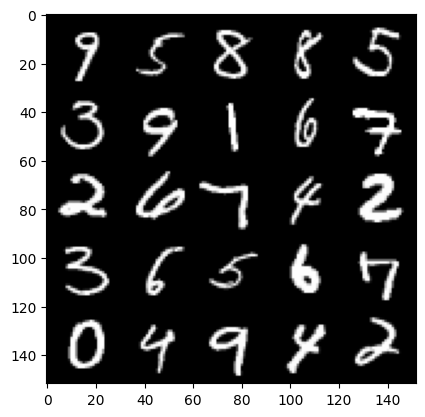

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9271915605068197, discriminator loss: 0.32381693127751343


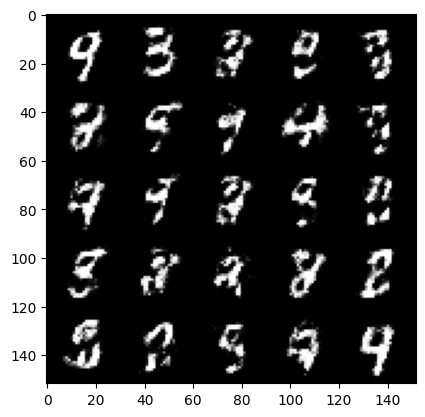

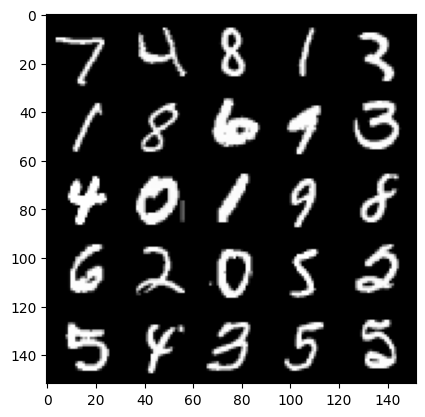

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.911256580352783, discriminator loss: 0.3305151015818117


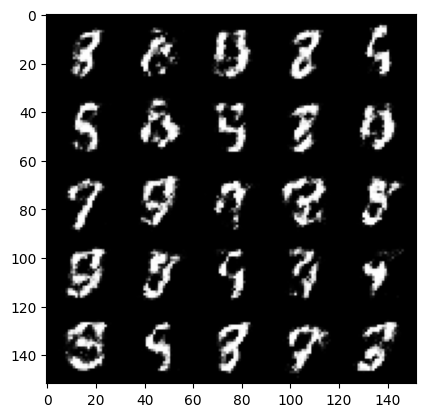

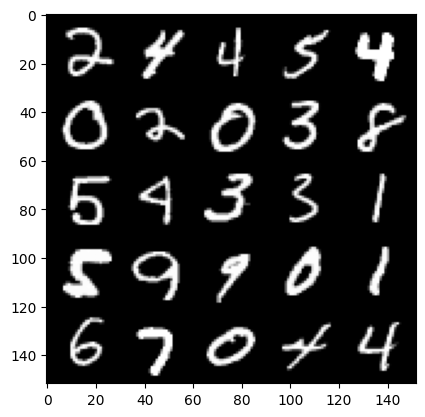

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.9558766598701471, discriminator loss: 0.3260363639593125


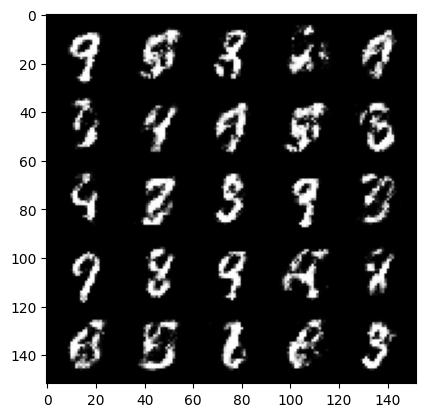

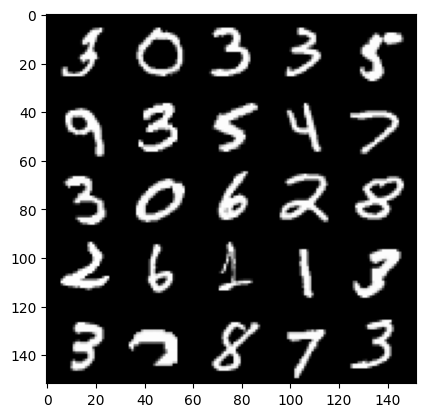

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.7733196446895607, discriminator loss: 0.3708931360840796


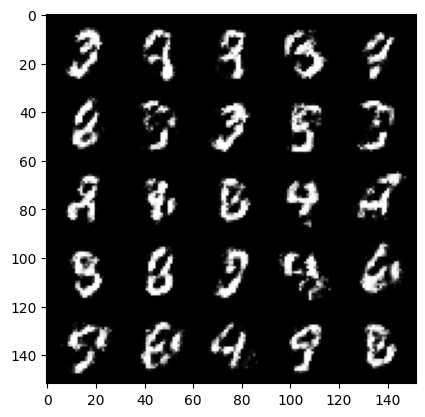

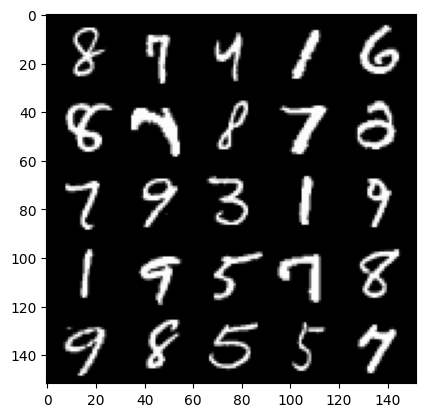

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.9263385655879977, discriminator loss: 0.33423196771740954


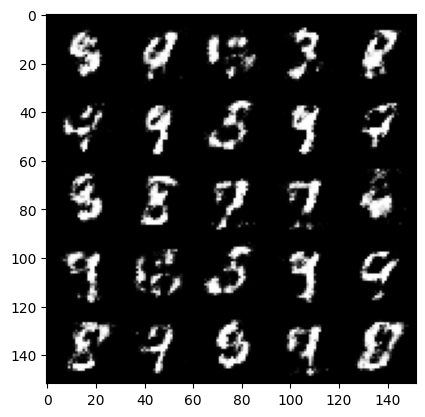

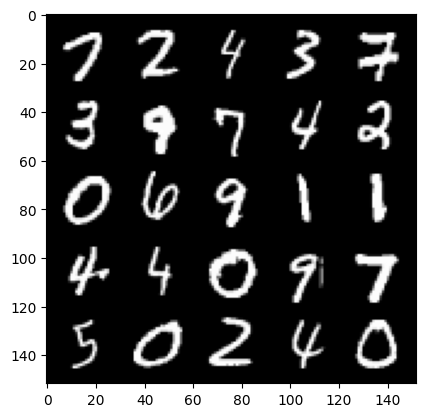

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.7573577728271483, discriminator loss: 0.368569989681244


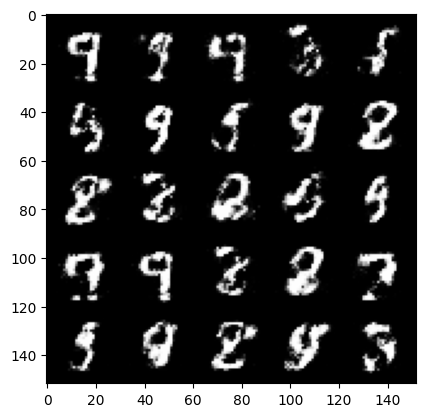

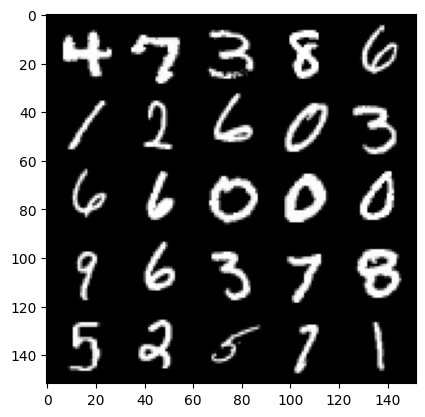

  0%|          | 0/469 [00:00<?, ?it/s]

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
